In [1]:
from nltk.tag import StanfordNERTagger
from nltk.tokenize import word_tokenize
import pickle
import numpy as np

In [2]:
raw_train = []
with open('ATIS_train.iob','r') as f:
    for line in f:
        raw_train.append(line)
        
raw_test = []
with open('ATIS_test.iob','r') as f:
    for line in f:
        raw_test.append(line)

In [3]:
raw=raw_train+raw_test

In [4]:
np.shape(raw_train)

(4978,)

In [5]:
np.shape(raw_test)

(893,)

In [6]:
ab=[a.split() for a in raw_train]

In [7]:
cd=[a.split() for a in raw_test]

In [8]:
cd[0][0]

'BOS'

In [9]:
train_label=[]

for sentence in ab:
    a=len(sentence)
    train_label.append(sentence[a-1])

In [10]:
test_label=[]

for sentence in cd:
    a=len(sentence)
    test_label.append(sentence[a-1])

In [11]:
train_label[0].replace('the',train_label[0])

'atis_flight'

In [12]:
train_label[3879]

'atis_city'

# FOR_REMOVING_MULTIPLE_LABEL_AND_CHOOSING_THE_FIRST_ONE

In [13]:
i=0
aa=-1
train2=list()
for word in train_label:
    aa=aa+1
    if '#' in word:
        print aa
        #print word
        for j in range(len(word)):
            if word[j]=='#':
                train_label[aa]=train_label[aa].replace(train_label[aa],word[0:j])
        i=i+1
print i
print len(train_label)      

570
602
719
859
1325
1769
2019
2030
2342
2693
2811
2874
2954
3155
3266
3336
3654
3746
3878
3971
4207
4373
4443
4612
4814
4923
26
4978


In [14]:
i=0
aa=-1
train2=list()
for word in test_label:
    aa=aa+1
    if '#' in word:
        print aa
        #print word
        for j in range(len(word)):
            if word[j]=='#':
                test_label[aa]=test_label[aa].replace(test_label[aa],word[0:j])
        i=i+1
print len(test_label)

12
206
207
208
213
229
405
406
407
492
497
498
499
604
642
893


In [15]:
with open('train_label.pickle', 'w+') as fp:
     pickle.dump(train_label,fp)
fp.close()
with open('test_label.pickle', 'w+') as fp:
     pickle.dump(test_label,fp)
fp.close()

In [16]:
np.shape(test_label)

(893,)

In [17]:
np.shape(train_label)

(4978,)

In [18]:
label=train_label+test_label

In [19]:
label_dict=dict()
a=0
for word in label:
    if(word not in label_dict):
            label_dict[word] = a
            a = a + 1

In [20]:
len(label_dict)

17

In [21]:
with open('label_dict.pickle', 'w+') as fp:
     pickle.dump(label_dict,fp)
fp.close()

# One Hot for labels

In [22]:
n = len(label_dict)

y_train_label = list()
for intent in train_label:
    out = np.zeros(n)
    out = list(out)
    out[label_dict[intent]] = 1
    y_train_label.append(out)
y_test_label = list()
for intent in test_label:
    out = np.zeros(n)
    out = list(out)
    out[label_dict[intent]] = 1
    y_test_label.append(out)
    

In [23]:
with open('y_test_label.pickle', 'w+') as fp:
     pickle.dump(y_test_label,fp)
fp.close()
with open('y_train_label.pickle', 'w+') as fp:
     pickle.dump(y_train_label,fp)
fp.close()

In [25]:
label_dict

{'atis_abbreviation': 8,
 'atis_aircraft': 3,
 'atis_aircraft#atis_flight': 16,
 'atis_airfare': 2,
 'atis_airline': 6,
 'atis_airport': 5,
 'atis_capacity': 13,
 'atis_city': 11,
 'atis_distance': 7,
 'atis_flight': 0,
 'atis_flight_no': 12,
 'atis_flight_time': 1,
 'atis_ground_fare': 9,
 'atis_ground_service': 4,
 'atis_meal': 14,
 'atis_quantity': 10,
 'atis_restriction': 15}

# Preprocessing

In [26]:
train = []
replace_dic = {'\'d' : "would" , '\'s' : "is" , '\'t' : "not"}
for sentence in raw_train:
    sentence = sentence.split('\t')[0][4:-4]
    words = sentence.split(' ')
    new_sentence = ""
    for i in range(len(words)):
        word = words[i]
        word = word.split("'")[0]
        if(word == ''):
            print word
            continue;
        if(word in replace_dic):
            print(word)
            word = replace_dic[word];
        if(word.isdigit()):
            word = "number"
        new_sentence = new_sentence + " " + word
    train.append(new_sentence[1:])

In [27]:
test = []
replace_dic = {'\'d' : "would" , '\'s' : "is" , '\'t' : "not"}
for sentence in raw_test:
    sentence = sentence.split('\t')[0][4:-4]
    words = sentence.split(' ')
    new_sentence = ""
    for i in range(len(words)):
        word = words[i]
        word = word.split("'")[0]
        if(word == ''):
            continue;
        if(word in replace_dic):
            word = replace_dic[word];
        if(word.isdigit()):
            word = "number"
        new_sentence = new_sentence + " " + word
    test.append(new_sentence[1:])

In [28]:
test[0][0]

'i'

In [29]:
with open('train_data.pickle', 'w+') as fp:
     pickle.dump(train,fp)
fp.close()

with open('test_data.pickle', 'w+') as fp:
     pickle.dump(test,fp)
fp.close()

In [30]:
with open('train_data.pickle', 'r+') as fp:
    train = pickle.load(fp)
fp.close()

with open('test_data.pickle', 'r+') as fp:
    test = pickle.load(fp)
fp.close()

In [31]:
test[0]

'i would like to find a flight from charlotte to las vegas that makes a stop in st. louis'

In [32]:
raw_test[0]

'BOS i would like to find a flight from charlotte to las vegas that makes a stop in st. louis EOS\tO O O O O O O O O B-fromloc.city_name O B-toloc.city_name I-toloc.city_name O O O O O B-stoploc.city_name I-stoploc.city_name atis_flight\n'

In [33]:
raw = raw_train + raw_test

# Dictionary Generation

In [34]:
def check(word):
    replace_dic = {'\'d' : "would" , '\'s' : "is" , '\'t' : "not"}
    word = word.split("'")[0]
    if(word == ''):
        return word
    if(word in replace_dic):
        word = replace_dic[word];
    if(word.isdigit()):
        word = "number"
    return word

In [35]:
slot_dict = dict()
word_dict = dict()

i_s = 0
i_w = 1

for utterance in raw:
    t = utterance.split('\t')
    words = t[0].strip().split(' ')
    slots = t[1].strip().split(' ')
    n = len(words)
    for i in xrange(n):
        word = check(words[i])
        if(word not in word_dict):
            word_dict[word] = i_w
            i_w = i_w + 1
    for i in xrange(n-1):
        if(slots[i] not in slot_dict):
            slot_dict[slots[i]] = i_s
            i_s = i_s + 1

In [36]:
len(slot_dict)

127

In [37]:
dicts = [slot_dict,word_dict]

In [38]:
with open('slot_word_dict.pickle', 'w+') as fp:
    pickle.dump(dicts,fp)
fp.close()

In [39]:
with open('slot_word_dict.pickle', 'r+') as fp:
    dicts = pickle.load(fp)
fp.close()

In [40]:
slot_dict,word_dict = dicts

In [41]:
len(word_dict)

766

# Sequence Making

In [45]:
def make_sequences(data,word_dict):
    sequences = list()
    for sentence in data:
        sequence = list()
        words = sentence.split(' ')
        for word in words:
                sequence.append(word_dict[word])
        sequences.append(sequence)
    return sequences

In [46]:
train_sequence = make_sequences(train,word_dict)
test_sequence = make_sequences(test,word_dict)

In [47]:
raw_train[0]

'BOS i want to fly from boston at 838 am and arrive in denver at 1110 in the morning EOS\t O O O O O O B-fromloc.city_name O B-depart_time.time I-depart_time.time O O O B-toloc.city_name O B-arrive_time.time O O B-arrive_time.period_of_day atis_flight\n'

train_sequence = make_sequences(train,word_dict)
test_sequence = make_sequences(test,word_dict)

In [48]:
test_sequence[0]

[2,
 81,
 82,
 4,
 111,
 46,
 32,
 6,
 144,
 4,
 260,
 261,
 143,
 345,
 46,
 223,
 13,
 115,
 116]

In [49]:
with open('train_sequence.pickle', 'w+') as fp:
     pickle.dump(train_sequence,fp)
fp.close()

with open('test_sequence.pickle', 'w+') as fp:
     pickle.dump(test_sequence,fp)
fp.close()

In [50]:
with open('train_sequence.pickle', 'r+') as fp:
    train_sequence = pickle.load(fp)
fp.close()

with open('test_sequence.pickle', 'r+') as fp:
    test_sequence = pickle.load(fp)
fp.close()

In [51]:
sequences = train_sequence + test_sequence

In [52]:
m = 0
lens = list()
for sequence in sequences:
    lens.append(len(sequence))
    m = max(len(sequence),m)
    
print m

46


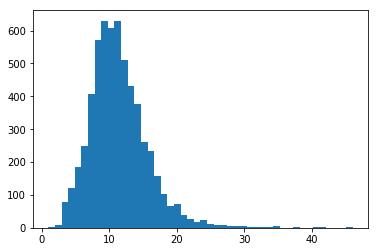

In [53]:
from matplotlib import pyplot
pyplot.hist(lens,46)
pyplot.show()

## One-Hot (Slot)

In [54]:
utterance = raw_train[0]
slots = utterance.split('\t')[1].strip().split(' ')[:-1]
slots = t
slots

['BOS find me a flight that flies from memphis to tacoma EOS',
 'O O O O O O O O B-fromloc.city_name O B-toloc.city_name atis_flight\n']

In [55]:
n = len(slot_dict)

y_train_slot = list()
for utterance in raw_train:
    outs = list()
    slots = utterance.split('\t')[1].strip().split(' ')[:-1]
    for slot in slots:
        out = np.zeros(n)
        out = list(out)
        out[slot_dict[slot]] = 1
        outs.append(out) 
    y_train_slot.append(outs)
    
y_test_slot = list()
for utterance in raw_test:
    outs = list()
    slots = utterance.split('\t')[1].strip().split(' ')[:-1]
    for slot in slots:
        out = np.zeros(n)
        out = list(out)
        out[slot_dict[slot]] = 1
        outs.append(out) 
    y_test_slot.append(outs)

In [56]:
np.shape(y_train_slot[5])

(10, 127)

# Make POS_dict

In [57]:
import nltk

In [58]:
pos_dict = dict()
i = 0

for utterance in train + test:
    tags = nltk.pos_tag(utterance.split(' '))
    for tag in tags:
        tag = tag[1]
        if(tag not in pos_dict):
            pos_dict[tag] = i
            i += 1

In [59]:
pos_dict

{'CC': 5,
 'CD': 21,
 'DT': 6,
 'EX': 22,
 'FW': 28,
 'IN': 4,
 'JJ': 9,
 'JJR': 26,
 'JJS': 12,
 'MD': 15,
 'NN': 0,
 'NNP': 25,
 'NNS': 8,
 'PDT': 20,
 'PRP': 14,
 'PRP$': 27,
 'RB': 17,
 'RBR': 29,
 'RBS': 19,
 'RP': 24,
 'TO': 2,
 'UH': 30,
 'VB': 3,
 'VBD': 23,
 'VBG': 11,
 'VBN': 13,
 'VBP': 1,
 'VBZ': 10,
 'WDT': 16,
 'WP': 7,
 'WRB': 18}

In [60]:
n = len(pos_dict)
max_len = 46

x_train_pos = list()
for utterance in train:
    outs = np.zeros((max_len,len(pos_dict)))
#     outs = list(outs)
    tags = nltk.pos_tag(utterance.split(' '))
    for i in range(len(tags)):
        outs[i][pos_dict[tags[i][1]]] = 1
    x_train_pos.append(outs)
    
x_test_pos = list()
for utterance in test:
    outs = np.zeros((max_len,len(pos_dict)))
#     outs = list(outs)
    tags = nltk.pos_tag(utterance.split(' '))
    for i in range(len(tags)):
        outs[i][pos_dict[tags[i][1]]] = 1
    x_test_pos.append(outs)

In [61]:
len(pos_dict)

31

In [62]:
train[3]

'cheapest airfare from tacoma to orlando'

In [63]:
x_train_pos[3][2]

array([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [64]:
import numpy as np
import keras
import os, pickle, sys, json, random, math 
from keras.models import Model, Sequential
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.text import Tokenizer
from keras.utils.np_utils import to_categorical
#from  keras.np_utils import probas_to_classes
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Conv1D,Conv2D, MaxPooling1D,MaxPooling2D, Embedding, LSTM,GRU, add, concatenate, TimeDistributed, Bidirectional,Reshape,Bidirectional
from sklearn.metrics.pairwise import cosine_similarity
from keras.layers import Dense, Input, Flatten, Merge, Dropout, concatenate, Concatenate
from sklearn.metrics import accuracy_score, f1_score

/home/sinchan/.local/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [65]:

with open('embedding_matrix_m.pickle', 'r+') as fp:
    embedding_matrix = pickle.load(fp)
fp.close()

with open('embedding_matrix_mw.pickle', 'r+') as fp:
    embedding_matrix_w = pickle.load(fp)
fp.close()
with open('embedding_matrix_mg.pickle', 'r+') as fp:
    embedding_matrix_g = pickle.load(fp)
fp.close()
with open('train_sequence.pickle', 'r+') as fp:
    train_sequence = pickle.load(fp)
fp.close()

with open('test_sequence.pickle', 'r+') as fp:
    test_sequence = pickle.load(fp)
fp.close()

with open('slot_word_dict.pickle', 'r+') as fp:
    slot_word_dict = pickle.load(fp)
fp.close()
train_sequence = pad_sequences(train_sequence, maxlen = 46, padding='post')
test_sequence = pad_sequences(test_sequence, maxlen = 46, padding='post') 

max_len = 46

In [66]:
n = len(slot_dict)

y_train_slot = list()
for utterance in raw_train:
    outs = np.zeros((max_len,len(slot_dict)))
    outs = list(outs)
    slots = utterance.split('\t')[1].strip().split(' ')[1:-1]
    for i in range(len(slots)):
        outs[i][slot_dict[slots[i]]] = 1
    y_train_slot.append(outs)
    
y_test_slot = list()
for utterance in raw_test:
    outs = np.zeros((max_len,len(slot_dict)))
    outs = list(outs)
    slots = utterance.split('\t')[1].strip().split(' ')[1:-1]
    for i in range(len(slots)):
        outs[i][slot_dict[slots[i]]] = 1
    y_test_slot.append(outs)

In [67]:
np.shape(y_train_slot)

(4978, 46, 127)

In [68]:
n = len(slot_dict)

z_train_slot = list()
for utterance in raw_train:
    outs = list()
    slots = utterance.split('\t')[1].strip().split(' ')[1:-1]
    for i in range(len(slots)):
        outs.append(slot_dict[slots[i]])
    z_train_slot.append(outs)
    
z_test_slot = list()
for utterance in raw_test:
    outs = list()
    slots = utterance.split('\t')[1].strip().split(' ')[1:-1]
    for i in range(len(slots)):
        outs.append(slot_dict[slots[i]])
    z_test_slot.append(outs)

In [69]:
np.shape(z_train_slot)

(4978,)

In [70]:
def make_z_pred_slot(mat,z_act_slot):
    ans = list()
    for i in range(len(mat)):
        ans.append(mat[i][:len(z_act_slot[i])])
    return ans

In [71]:
def accu(list1, list2):
    if(len(list1) != len(list2)):
        print("Size of a the lists not equal")
        return
    count = 0.0
    for i in range(len(list1)):
        if(list1[i] == list2[i]):
            count = count + 1
            
    return count/len(list1)

In [72]:
def flatten(mat):
    arr = list()
    for ar in mat:
        for a in ar:
            arr.append(a)
    return arr

In [73]:
z_train_intent = list()
z_test_intent = list()

for out in y_train_label:
    for i in range(len(out)):
        if(out[i] == 1):
            z_train_intent.append(i)
        
for out in y_test_label:
    for i in range(len(out)):
        if(out[i] == 1):
            z_test_intent.append(i)

In [74]:
a=[y_test_label,y_test_slot]

In [75]:
np.shape(a)

(2, 893)

# Context

In [73]:
from gensim.models import KeyedVectors
w2v = KeyedVectors.load_word2vec_format("~/Resources/GoogleNews-vectors-negative300.bin",binary = True)

In [132]:
import numpy as np
def loadGloveModel(gloveFile):
    print "Loading Glove Model"
    f = open(gloveFile,'r')
    model = {}
    for line in f:
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print "Done.",len(model)," words loaded!"
    return model

glove = loadGloveModel("/home1/mauzama/Resources/glove.840B.300d.txt")

Loading Glove Model
Done. 2196016  words loaded!


In [134]:
glove_embeddings = dict()
for word in word_dict:
    try:
        glove_embeddings[word] = glove[word]
    except:
        ;

In [133]:
glove['to']

array([ 3.1924e-01,  6.3160e-02, -2.7858e-01,  2.6120e-01,  7.9248e-02,
       -2.1462e-01, -1.0495e-01,  1.5495e-01, -3.3530e-02,  2.4834e+00,
       -5.0904e-01,  8.7490e-02,  2.1426e-01,  2.2151e-01, -2.5234e-01,
       -9.7544e-02, -1.9270e-01,  1.3606e+00, -1.1592e-01, -1.0383e-01,
        2.1929e-01,  1.1997e-01, -1.1063e-01,  1.4212e-01, -1.6643e-01,
        2.1815e-01,  4.2086e-03, -7.0012e-02, -2.3532e-01, -2.6518e-01,
        3.1248e-02,  1.6669e-01, -8.9777e-02,  2.0059e-01,  3.1614e-01,
       -5.5830e-01,  7.5735e-02,  2.7635e-01,  1.2741e-01, -1.8185e-01,
       -1.2722e-01,  2.4686e-02, -7.7233e-02, -4.8998e-01,  2.0355e-02,
        3.9164e-03,  1.2150e-01,  8.9723e-02, -7.8975e-02,  8.1443e-02,
       -9.9087e-02, -5.5621e-02,  1.0737e-01, -4.4042e-03,  4.8496e-01,
        1.1717e-01, -1.7329e-02,  1.0900e-01, -3.5558e-01,  5.1084e-02,
        1.5714e-01,  1.7961e-01, -2.9711e-01,  3.3645e-02, -2.5792e-02,
       -1.3931e-02, -2.3000e-01, -4.0306e-02,  2.2282e-01, -1.35

In [388]:
glove_embeddings['unk']=glove['unk']

In [74]:
w2v_embeddings = dict()
for word in word_dict:
    try:
        w2v_embeddings[word] = w2v[word]
    except:
         ;

In [87]:
nb_words = len(word_dict)
EMBEDDING_DIM = 300
embedding_matrix = np.zeros((nb_words+1, EMBEDDING_DIM))

i = 0
x_g = x_w = 0
for word in word_dict:
        
    try:
        embedding_matrix[word_dict[word]][:300] = w2v_embeddings[word]
    except KeyError:
        x_w += 1

In [88]:
from nltk.tokenize import word_tokenize

In [511]:
with open('glove_embeddings.pickle', 'w+') as fp:
     pickle.dump(glove_embeddings,fp)
fp.close()

In [77]:
with open('glove_embeddings.pickle', 'r+') as fp:
    glove_embeddings = pickle.load(fp)
fp.close()

In [78]:
tok_test=[]
for sen in test:
    x=word_tokenize(sen)
    tok_test.append(x)

In [79]:
len(tok_test[0])

19

In [230]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home1/mauzama/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [80]:
tok_train=[]
for sen in train:
    x=word_tokenize(sen)
    tok_train.append(x)

In [213]:
i=0
for c in range(len(tok_test)):
    for d in range(len(c)):
        print len(c)

TypeError: object of type 'int' has no len()

In [81]:
tok_test2=[]
i=0
for sen in tok_test:
    i=i+1
    #print i
    z=[]
    a=len(sen)
    b=46-a
    print b
    u='unk'
    for s in range(0,b):
        sen.append(u)
    #print sen
    tok_test2.append(sen)
        

27
30
33
30
29
30
35
29
29
33
38
26
29
33
38
32
38
37
37
37
38
37
37
37
37
34
26
36
36
35
36
39
34
38
33
37
32
37
36
34
35
41
38
37
36
37
37
33
38
38
34
33
37
37
38
35
33
34
34
33
29
31
31
32
32
30
32
20
25
33
31
29
33
24
33
34
33
34
33
34
30
37
32
35
34
32
33
37
29
37
38
37
32
35
32
33
30
33
29
32
31
30
29
33
38
36
34
34
35
38
36
33
34
36
31
35
35
35
35
32
28
34
34
34
30
38
34
17
34
35
28
32
34
30
30
32
40
38
37
31
39
27
33
35
35
36
35
35
35
35
36
33
35
31
32
37
36
39
39
35
36
35
39
38
37
38
25
26
39
38
38
37
33
31
34
41
30
36
41
39
39
41
33
34
34
33
37
36
36
32
37
39
38
38
38
37
37
38
37
36
36
35
31
33
33
39
32
32
33
36
38
39
37
35
40
38
35
34
30
30
30
38
38
39
38
38
37
37
33
34
41
35
30
34
32
38
35
38
36
35
37
37
38
38
35
35
39
39
39
34
34
36
41
38
39
38
36
35
35
36
37
38
30
30
39
38
39
37
37
39
37
36
40
40
38
39
40
42
40
37
41
38
37
36
34
38
37
35
36
35
36
40
32
37
36
36
36
36
35
30
35
32
30
37
42
33
34
34
34
35
34
29
29
36
36
32
25
29
30
36
39
32
30
28
30
34
42
34
35
31
37
33
37
3

In [82]:
tok_train2=[]
i=0
for sen in tok_train:
    i=i+1
    #print i
    z=[]
    a=len(sen)
    b=46-a
    print b
    u='unk'
    for s in range(0,b):
        sen.append(u)
    #print sen
    tok_train2.append(sen)

28
35
31
40
36
37
33
35
40
37
37
33
41
37
39
36
39
32
28
32
34
37
34
37
31
36
39
26
43
35
35
30
40
29
37
39
38
35
36
31
37
22
38
35
43
42
38
41
28
35
28
41
34
37
35
41
34
27
36
30
30
32
36
34
39
33
28
38
37
38
40
35
39
40
33
39
23
34
36
31
39
39
35
31
35
35
32
31
33
32
38
37
37
34
34
41
33
30
40
34
37
35
33
35
39
35
39
37
30
35
40
36
37
30
38
36
37
31
33
35
32
36
31
25
37
19
36
37
30
32
35
35
39
26
35
35
38
31
37
35
35
28
41
31
35
39
37
26
30
35
38
28
32
35
38
35
37
37
35
39
35
23
35
38
36
35
37
32
38
39
36
41
32
31
33
27
31
36
33
36
35
34
32
35
37
38
39
34
39
28
41
36
29
32
28
41
36
27
35
31
39
28
34
43
42
33
34
34
34
39
32
40
34
34
39
32
37
37
22
35
37
36
32
39
36
35
32
32
32
34
38
32
34
31
38
39
38
37
34
29
38
32
32
31
41
38
33
35
35
38
37
26
31
41
35
26
33
36
34
34
36
41
30
41
39
33
26
33
38
36
34
36
40
34
39
35
36
40
43
39
33
35
28
41
36
37
32
31
38
36
36
30
36
30
37
38
38
33
37
38
32
31
32
34
38
40
42
32
34
39
38
38
25
36
32
36
33
36
38
32
31
35
35
33
34
43
41
33
32
40
39
35
33
3

41
34
36
39
29
29
32
33
38
33
39
33
36
43
32
34
38
36
36
41
36
38
31
28
34
38
34
42
26
36
30
39
36
36
37
34
38
38
42
34
39
42
38
29
34
37
38
41
34
42
39
35
35
35
38
33
36
38
36
37
34
36
37
40
39
41
36
41
37
32
37
33
29
39
33
36
39
35
38
31
33
33
26
35
38
31
38
36
28
37
28
35
32
37
31
38
32
29
42
34
35
42
38
36
33
33
39
30
35
37
34
31
34
39
38
37
26
37
37
36
36
37
39
28
32
38
31
27
41
41
32
25
41
38
39
35
38
29
38
35
40
40
38
36
36
36
39
31
36
32
38
31
34
39
41
30
32
36
38
36
39
33
41
35
40
37
38
29
35
41
36
41
29
41
36
40
32
38
38
37
35
34
38
35
40
38
40
34
43
28
35
41
32
29
37
33
35
32
35
32
41
24
37
33
35
38
34
38
27
37
34
43
38
43
36
26
30
15
36
33
29
38
32
36
39
38
35
38
39
34
35
37
39
30
34
40
36
38
43
40
37
37
32
33
35
34
37
36
40
42
36
37
43
38
31
29
37
39
39
35
38
32
33
33
30
20
35
36
37
36
35
37
34
38
38
36
33
34
35
34
32
32
38
33
30
27
38
33
30
36
39
36
38
38
35
36
24
36
34
38
31
39
38
37
34
34
38
31
35
36
35
42
30
37
33
32
36
38
33
38
33
35
32
33
32
33
33
38
32
35
34
37
35
3

In [83]:
len(tok_train[892])

46

In [84]:
z=np.zeros(300)

In [85]:
test_con =[]
for a in range(len(tok_test)):
    x=[]
    for b in range(len(tok_test[a])):
        #y=len(tok_test[a])
        y=[]
        if b==0:
            temp=tok_test[a][b]
            temp1=tok_test[a][b+1]
            try:
                print b
                print temp
                print temp1
                #for xx in range(0,300):
                    #y[xx] = '0'
                y[0:300]=z
                y[300:600]=glove_embeddings[temp]
                y[600:900]=glove_embeddings[temp1]
            except:
                ;
        elif b==(len(tok_test[a])-1):
            temp0=tok_test[a][b-1]
            temp=tok_test[a][b]
            try:
                print b
                print temp0
                print temp
                y[0:300]=glove_embeddings[temp0]
                y[300:600]=glove_embeddings[temp]
                y[600:900]=z
            except:
                ;
        else:
            temp0=tok_test[a][b-1]
            temp=tok_test[a][b]
            temp1=tok_test[a][b+1]
            try:
                print b
                print temp0
                print temp
                print temp1
                y[0:300] = glove_embeddings[temp0]
                y[300:600]=glove_embeddings[temp]
                y[600:900]=glove_embeddings[temp1]
            except:
                ;
        x.append(y)
    test_con.append(x)

0
i
would
1
i
would
like
2
would
like
to
3
like
to
find
4
to
find
a
5
find
a
flight
6
a
flight
from
7
flight
from
charlotte
8
from
charlotte
to
9
charlotte
to
las
10
to
las
vegas
11
las
vegas
that
12
vegas
that
makes
13
that
makes
a
14
makes
a
stop
15
a
stop
in
16
stop
in
st.
17
in
st.
louis
18
st.
louis
unk
19
louis
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
on
april
1
on
april
first
2
april
first
i
3
first
i
need
4
i
need
a
5
need
a
ticket
6
a
ticket
from
7
ticket
from
tacoma
8
from
tacoma
to
9
tacoma
to
san
10
to
san
jose
11
san
jose
departing
12
jose
departing
before
13
departing
before
number
14
before
number
am
15
number
am
unk
16
am

unk
unk
unk
45
unk
unk
0
show
flights
1
show
flights
from
2
flights
from
burbank
3
from
burbank
to
4
burbank
to
st.
5
to
st.
louis
6
st.
louis
on
7
louis
on
monday
8
on
monday
unk
9
monday
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
flights
1
show
flights
from
2
flights
from
burbank
3
from
burbank
to
4
burbank
to
milwaukee
5
to
milwaukee
on
6
milwaukee
on
monday
7
on
monday
unk
8
monday
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk

unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
does
tacoma
1
does
tacoma
airport
2
tacoma
airport
offer
3
airport
offer
transportation
4
offer
transportation
from
5
transportation
from
the
6
from
the
airport
7
the
airport
to
8
airport
to
the
9
to
the
downtown
10
the
downtown
area
11
downtown
area
unk
12
area
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk


unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
a
2
need
a
flight
3
a
flight
from
4
flight
from
toronto
5
from
toronto
to
6
toronto
to
st.
7
to
st.
louis
8
st.
louis
unk
9
louis
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk


unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
which
round
1
which
round
trip
2
round
trip
flights
3
trip
flights
leave
4
flights
leave
chicago
5
leave
chicago
next
6
chicago
next
tuesday
7
next
tuesday
around
8
tuesday
around
number
9
around
number
pm
10
number
pm
and
11
pm
and
arrive
12
and
arrive
in
13
arrive
in
detroit
14
in
detroit
unk
15
detroit
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk


13
toronto
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
on
friday
1
on
friday
morning
2
friday
morning
i
3
morning
i
would
4
i
would
like
5
would
like
to
6
like
to
fly
7
to
fly
from
8
fly
from
toronto
9
from
toronto
to
10
toronto
to
montreal
11
to
montreal
unk
12
montreal
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
u

unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
please
find
1
please
find
a
2
find
a
flight
3
a
flight
from
4
flight
from
orlando
5
from
orlando
to
6
orlando
to
kansas
7
to
kansas
city
8
kansas
city
unk
9
city
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
would
1
i
would
like
2
would
like
to
3
like
to
fly
4
to
fly
from
5
fly
from
columbus
6
from
columbus
to
7
columbus
to
phoen

the
departure
times
4
departure
times
from
5
times
from
detroit
6
from
detroit
to
7
detroit
to
westchester
8
to
westchester
county
9
westchester
county
unk
10
county
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
the
2
is
the
latest
3
the
latest
flight
4
latest
flight
from
5
flight
from
baltimore
6
from
baltimore
to
7
baltimore
to
oakland
8
to
oakland
that
9
oakland
that
serves
10
that
serves
dinner
11
serves
dinner
unk
12
dinner
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk


unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
all
2
me
all
the
3
all
the
flights
4
the
flights
from
5
flights
from
charlotte
6
from
charlotte
to
7
charlotte
to
minneapolis
8
to
minneapolis
on
9
minneapolis
on
tuesday
10
on
tuesday
morning
11
tuesday
morning
unk
12
morning
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
the
2
me
the
direct
3
the
direct
flights
4
direct
flights
from
5
flights
from
charlotte
6
from
charlotte
to
7
charlotte
to
minneapolis
8
to
minneapolis
on
9
minneapolis
o

unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
is
there
1
is
there
an
2
there
an
american
3
an
american
airlines
4
american
airlines
flight
5
airlines
flight
from
6
flight
from
houston
7
from
houston
to
8
houston
to
newark
9
to
newark
on
10
newark
on
june
11
on
june
tenth
12
june
tenth
after
13
tenth
after
number
14
after
number
pm
15
number
pm
unk
16
pm
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
is
there
1
is
there
an
2
there
an
american
3
an
american
airlines
4
american
airlines
flight
5
airlines
flight
from
6
flight
from
houston
7
from
houston
to
8
houston
to
newark
9
to
newark
on
10


seventh
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
the
1
list
the
flights
2
the
flights
from
3
flights
from
denver
4
from
denver
to
5
denver
to
cincinnati
6
to
cincinnati
on
7
cincinnati
on
june
8
on
june
eighth
9
june
eighth
unk
10
eighth
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
u

unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
how
many
1
how
many
canadian
2
many
canadian
airlines
3
canadian
airlines
flights
4
airlines
flights
use
5
flights
use
aircraft
6
use
aircraft
dh8
7
aircraft
dh8
unk
8
dh8
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
4

5
number
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
the
1
list
the
tower
2
the
tower
air
3
tower
air
flights
4
air
flights
on
5
flights
on
mondays
6
on
mondays
unk
7
mondays
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
2

17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
how
far
1
how
far
is
2
far
is
san
3
is
san
francisco
4
san
francisco
international
5
francisco
international
from
6
international
from
downtown
7
from
downtown
unk
8
downtown
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk

fares
5
their
fares
from
6
fares
from
indianapolis
7
from
indianapolis
to
8
indianapolis
to
memphis
9
to
memphis
on
10
memphis
on
a
11
on
a
monday
12
a
monday
morning
13
monday
morning
unk
14
morning
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
all
1
list
all
flights
2
all
flights
and
3
flights
and
their
4
and
their
fares
5
their
fares
from
6
fares
from
memphis
7
from
memphis
to
8
memphis
to
miami
9
to
miami
on
10
miami
on
a
11
on
a
wednesday
12
a
wednesday
evening
13
wednesday
evening
unk
14
evening
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk

unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
evening
1
list
evening
flights
2
evening
flights
from
3
flights
from
tampa
4
from
tampa
to
5
tampa
to
cincinnati
6
to
cincinnati
unk
7
cincinnati
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
u

30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
american
1
list
american
airlines
2
american
airlines
flights
3
airlines
flights
from
4
flights
from
houston
5
from
houston
to
6
houston
to
milwaukee
7
to
milwaukee
departing
8
milwaukee
departing
friday
9
departing
friday
pm
10
friday
pm
unk
11
pm
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
un

unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
first
1
list
first
class
2
first
class
airfare
3
class
airfare
round
4
airfare
round
trip
5
round
trip
from
6
trip
from
indianapolis
7
from
indianapolis
to
8
indianapolis
to
memphis
9
to
memphis
unk
10
memphis
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33

unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
atlanta
to
1
atlanta
to
st.
2
to
st.
louis
3
st.
louis
tuesday
4
louis
tuesday
before
5
tuesday
before
number
6
before
number
pm
7
number
pm
flights
8
pm
flights
unk
9
flights
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk


unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
would
1
i
would
like
2
would
like
flights
3
like
flights
from
4
flights
from
ontario
5
from
ontario
to
6
ontario
to
tacoma
7
to
tacoma
unk
8
tacoma
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
u

unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
would
1
i
would
like
2
would
like
flights
3
like
flights
leaving
4
flights
leaving
san
5
leaving
san
francisco
6
san
francisco
to
7
francisco
to
san
8
to
san
diego
9
san
diego
unk
10
diego
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
would
1
i
would
like
2
would
like
a
3
like
a
flight
4
a
flight
from
5
flight
from
san


unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
now
show
1
now
show
me
2
show
me
one
3
me
one
way
4
one
way
flights
5
way
flights
from
6
flights
from
houston
7
from
houston
to
8
houston
to
boston
9
to
boston
unk
10
boston
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk

unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
to
2
need
to
rent
3
to
rent
a
4
rent
a
car
5
a
car
in
6
car
in
washington
7
in
washington
dc
8
washington
dc
unk
9
dc
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
can
i
1
can
i
get
2
i
get
a
3
get
a
flight
4
a
flight
on
5
flight
on
tuesday
6
on
tuesday
night
7
tu

unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
can
i
1
can
i
get
2
i
get
a
3
get
a
flight
4
a
flight
today
5
flight
today
from
6
today
from
san
7
from
san
francisco
8
san
francisco
to
9
francisco
to
detroit
10
to
detroit
michigan
11
detroit
michigan
unk
12
michigan
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
u

flight
between
oakland
7
between
oakland
and
8
oakland
and
salt
9
and
salt
lake
10
salt
lake
city
11
lake
city
unk
12
city
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
airline
1
what
airline
is
2
airline
is
dl
3
is
dl
unk
4
dl
unk
unk
5
unk
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
un

between
dca
6
between
dca
and
7
dca
and
downtown
8
and
downtown
washington
9
downtown
washington
unk
10
washington
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
are
1
what
are
the
2
are
the
flights
3
the
flights
between
4
flights
between
dca
5
between
dca
and
6
dca
and
milwaukee
7
and
milwaukee
unk
8
milwaukee
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk


unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
like
1
i
like
to
2
like
to
fly
3
to
fly
from
4
fly
from
cleveland
5
from
cleveland
to
6
cleveland
to
dallas
7
to
dallas
unk
8
dallas
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
want
1
i
want
to
2
want

flight
from
4
flight
from
nashville
5
from
nashville
to
6
nashville
to
seattle
7
to
seattle
that
8
seattle
that
arrives
9
that
arrives
no
10
arrives
no
later
11
no
later
than
12
later
than
number
13
than
number
pm
14
number
pm
unk
15
pm
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
want
1
i
want
a
2
want
a
flight
3
a
flight
from
4
flight
from
memphis
5
from
memphis
to
6
memphis
to
seattle
7
to
seattle
that
8
seattle
that
arrives
9
that
arrives
no
10
arrives
no
later
11
no
later
than
12
later
than
number
13
than
number
pm
14
number
pm
unk
15
pm
unk
unk
16
unk
unk
unk
17
unk
unk
unk


unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
flights
1
show
flights
from
2
flights
from
denver
3
from
denver
to
4
denver
to
houston
5
to
houston
unk
6
houston
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
u

13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
flights
1
list
flights
from
2
flights
from
toronto
3
from
toronto
to
4
toronto
to
washington
5
to
washington
dc
6
washington
dc
unk
7
dc
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk

unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
information
2
need
information
on
3
information
on
flights
4
on
flights
from
5
flights
from
washington
6
from
washington
to
7
washington
to
boston
8
to
boston
that
9
boston
that
leave
10
that
leave
on
11
leave
on
a
12
on
a
saturday
13
a
saturday
unk
14
saturday
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
the
2
need
the
flights
3
the
flights
from
4
flights
from
washington


11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
get
last
1
get
last
flight
2
last
flight
from
3
flight
from
oakland
4
from
oakland
to
5
oakland
to
salt
6
to
salt
lake
7
salt
lake
city
8
lake
city
on
9
city
on
wednesday
10
on
wednesday
or
11
wednesday
or
first
12
or
first
flight
13
first
flight
from
14
flight
from
oakland
15
from
oakland
to
16
oakland
to
salt
17
to
salt
lake
18
salt
lake
city
19
lake
city
on
20
city
on
thursday
21
on
thursday
unk
22
thursday
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk

unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
flight
2
need
flight
and
3
flight
and
airline
4
and
airline
information
5
airline
information
for
6
information
for
a
7
for
a
flight
8
a
flight
from
9
flight
from
denver
10
from
denver
to
11
denver
to
salt
12
to
salt
lake
13
salt
lake
city
14
lake
city
on
15
city
on
monday
16
on
monday
departing
17
monday
departing
after
18
departing
after
number
19
after
number
pm
20
number
pm
unk
21
pm
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
is
there
1
is
there
ground
2
t

9
lake
city
unk
10
city
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
flights
1
list
flights
from
2
flights
from
oakland
3
from
oakland
to
4
oakland
to
salt
5
to
salt
lake
6
salt
lake
city
7
lake
city
before
8
city
before
number
9
before
number
am
10
number
am
thursday
11
am
thursday
morning
12
thursday
morning
unk
13
morning
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
un

unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
need
1
i
need
information
2
need
information
on
3
information
on
flights
4
on
flights
from
5
flights
from
toronto
6
from
toronto
to
7
toronto
to
san
8
to
san
diego
9
san
diego
unk
10
diego
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
want
1
i
want
a
2
want
a
flight
3
a
flight
from
4

7
montreal
please
unk
8
please
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
airline
1
what
airline
is
2
airline
is
dl
3
is
dl
unk
4
dl
unk
unk
5
unk
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
u

unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
round
2
me
round
trips
3
round
trips
between
4
trips
between
montreal
5
between
montreal
and
6
montreal
and
orlando
7
and
orlando
unk
8
orlando
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
rou

unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
which
airline
1
which
airline
is
2
airline
is
us
3
is
us
unk
4
us
unk
unk
5
unk
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk

unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
first
2
me
first
class
3
first
class
flights
4
class
flights
from
5
flights
from
new
6
from
new
york
7
new
york
to
8
york
to
miami
9
to
miami
round
10
miami
round
trip
11
round
trip
unk
12
trip
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
first
2
me
first
class
3
first
class
flights
4
class
flights
from
5
flights
from
new
6
from
new
york
7
new
york
t

unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
the
2
me
the
nonstop
3
the
nonstop
flights
4
nonstop
flights
from
5
flights
from
toronto
6
from
toronto
to
7
toronto
to
st.
8
to
st.
petersburg
9
st.
petersburg
unk
10
petersburg
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
un

32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
flights
1
list
flights
from
2
flights
from
dallas
3
from
dallas
to
4
dallas
to
houston
5
to
houston
unk
6
houston
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
distance
1
list
distance
from
2
distance
from
airports
3
from
airports
to
4
airp

24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
flights
1
list
flights
from
2
flights
from
ontario
3
from
ontario
california
4
ontario
california
to
5
california
to
orlando
6
to
orlando
unk
7
orlando
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk

0
list
flights
1
list
flights
from
2
flights
from
tampa
3
from
tampa
to
4
tampa
to
cincinnati
5
to
cincinnati
after
6
cincinnati
after
number
7
after
number
pm
8
number
pm
unk
9
pm
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
list
airlines
1
list
airlines
that
2
airlines
that
fly
3
that
fly
from
4
fly
from
seattle
5
from
seattle
to
6
seattle
to
salt
7
to
salt
lake
8
salt
lake
city
9
lake
city
unk
10
city
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
u

22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
give
me
1
give
me
the
2
me
the
flights
3
the
flights
from
4
flights
from
phoenix
5
from
phoenix
to
6
phoenix
to
milwaukee
7
to
milwaukee
on
8
milwaukee
on
american
9
on
american
airlines
10
american
airlines
unk
11
airlines
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
un

unk
44
unk
unk
unk
45
unk
unk
0
give
me
1
give
me
a
2
me
a
flight
3
a
flight
from
4
flight
from
charlotte
5
from
charlotte
to
6
charlotte
to
baltimore
7
to
baltimore
on
8
baltimore
on
tuesday
9
on
tuesday
morning
10
tuesday
morning
unk
11
morning
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
can
i
1
can
i
have
2
i
have
a
3
have
a
morning
4
a
morning
flight
5
morning
flight
from
6
flight
from
baltimore
7
from
baltimore
to
8
baltimore
to
newark
9
to
newark
please
10
newark
please
unk
11
please
unk
unk
12
unk
unk
unk
13
unk
unk

20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
dallas
to
1
dallas
to
houston
2
to
houston
after
3
houston
after
number
4
after
number
am
5
number
am
unk
6
am
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
4

unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
pittsburgh
to
1
pittsburgh
to
los
2
to
los
angeles
3
los
angeles
thursday
4
angeles
thursday
evening
5
thursday
evening
unk
6
evening
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
milwaukee
to
1
milwaukee
to
phoenix
2
to
phoenix
on
3
phoenix
on
saturday
4
on
saturday
unk
5
saturday
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
u

18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
a
2
is
a
d9s
3
a
d9s
unk
4
d9s
unk
unk
5
unk
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
un

unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
the
2
is
the
earliest
3
the
earliest
arriving
4
earliest
arriving
flight
5
arriving
flight
from
6
flight
from
boston
7
from
boston
to
8
boston
to
washington
9
to
washington
dc
10
washington
dc
unk
11
dc
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
the
2
is
the
earliest
3
the
earliest
arriving
4
earliest
arriving
flight
5
arriving
flight
between
6
flight
between
boston
7
between
boston
and
8
boston


capacity
of
the
5
of
the
73s
6
the
73s
unk
7
73s
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
73s
2
is
73s
unk
3
73s
unk
unk
4
unk
unk
unk
5
unk
unk
unk
6
unk
unk
unk
7
unk
unk
unk
8
unk
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
u

unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
the
2
is
the
seating
3
the
seating
capacity
4
seating
capacity
of
5
capacity
of
the
6
of
the
m80
7
the
m80
unk
8
m80
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
is
1
what
is
the
2
is
the
seating
3
the
seating
capacity
4
seating
capacity
on
5
capacity
on
the
6
on
the
aircraft
7
the
aircraft
m80
8
aircraft
m80
unk
9
m80
unk
unk
10
unk


unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
please
list
1
please
list
ground
2
list
ground
transportation
3
ground
transportation
from
4
transportation
from
ewr
5
from
ewr
into
6
ewr
into
new
7
into
new
york
8
new
york
city
9
york
city
unk
10
city
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
show
me
1
show
me
the
2
me
the
morning
3
the
morning
flights
4
morning
flights
from
5
flights
from
memphis
6
from
memphis
to
7
memphis
to
new
8
to
new
york
9
new
york
city
10
york
city
unk
11
city
unk
unk
12
unk
unk
unk
13
un

13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
want
1
i
want
a
2
want
a
flight
3
a
flight
from
4
flight
from
los
5
from
los
angeles
6
los
angeles
to
7
angeles
to
charlotte
8
to
charlotte
early
9
charlotte
early
in
10
early
in
the
11
in
the
morning
12
the
morning
unk
13
morning
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk


30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
are
1
what
are
the
2
are
the
flights
3
the
flights
from
4
flights
from
ontario
5
from
ontario
to
6
ontario
to
memphis
7
to
memphis
unk
8
memphis
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
type
1
what
type
of
2
type
of
ground
3
of
groun

unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
what
are
1
what
are
the
2
are
the
flights
3
the
flights
between
4
flights
between
cincinnati
5
between
cincinnati
and
6
cincinnati
and
san
7
and
san
jose
8
san
jose
california
9
jose
california
which
10
california
which
leave
11
which
leave
after
12
leave
after
number
13
after
number
pm
14
number
pm
unk
15
pm
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk


flights
from
5
flights
from
chicago
6
from
chicago
to
7
chicago
to
kansas
8
to
kansas
city
9
kansas
city
on
10
city
on
june
11
on
june
seventeenth
12
june
seventeenth
unk
13
seventeenth
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
i
like
1
i
like
to
2
like
to
travel
3
to
travel
from
4
travel
from
burbank
5
from
burbank
to
6
burbank
to
milwaukee
7
to
milwaukee
unk
8
milwaukee
unk
unk
9
unk
unk
unk
10
unk
unk
unk
11
unk
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
un

please
find
1
please
find
a
2
find
a
flight
3
a
flight
round
4
flight
round
trip
5
round
trip
from
6
trip
from
los
7
from
los
angeles
8
los
angeles
to
9
angeles
to
tacoma
10
to
tacoma
washington
11
tacoma
washington
with
12
washington
with
a
13
with
a
stopover
14
a
stopover
in
15
stopover
in
san
16
in
san
francisco
17
san
francisco
not
18
francisco
not
exceeding
19
not
exceeding
the
20
exceeding
the
price
21
the
price
of
22
price
of
number
23
of
number
dollars
24
number
dollars
for
25
dollars
for
june
26
for
june
tenth
27
june
tenth
number
28
tenth
number
unk
29
number
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
are
there
1
are
there
any
2
there
any
flights
3
any
flights
on
4
flights
on
june
5
on
june
tenth
6
june
tenth
from
7
tenth
from
burbank
8
from
burbank
to
9
burbank
to
tacoma
10
t

13
on
united
airlines
14
united
airlines
for
15
airlines
for
next
16
for
next
saturday
17
next
saturday
unk
18
saturday
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk
31
unk
unk
unk
32
unk
unk
unk
33
unk
unk
unk
34
unk
unk
unk
35
unk
unk
unk
36
unk
unk
unk
37
unk
unk
unk
38
unk
unk
unk
39
unk
unk
unk
40
unk
unk
unk
41
unk
unk
unk
42
unk
unk
unk
43
unk
unk
unk
44
unk
unk
unk
45
unk
unk
0
tell
me
1
tell
me
all
2
me
all
the
3
all
the
airports
4
the
airports
in
5
airports
in
the
6
in
the
new
7
the
new
york
8
new
york
city
9
york
city
area
10
city
area
unk
11
area
unk
unk
12
unk
unk
unk
13
unk
unk
unk
14
unk
unk
unk
15
unk
unk
unk
16
unk
unk
unk
17
unk
unk
unk
18
unk
unk
unk
19
unk
unk
unk
20
unk
unk
unk
21
unk
unk
unk
22
unk
unk
unk
23
unk
unk
unk
24
unk
unk
unk
25
unk
unk
unk
26
unk
unk
unk
27
unk
unk
unk
28
unk
unk
unk
29
unk
unk
unk
30
unk
unk
unk


In [310]:
len(train_con[0])

46

In [485]:
train_con =[]
for a in range(len(tok_train)):
    print a
    x=[]
    for b in range(len(tok_train[a])):
        #y=len(tok_train[a])
        y=[]
        if b==0:
            temp=tok_train[a][b]
            temp1=tok_train[a][b+1]
            try:
                #print b
                print temp
                print temp1
                #for xx in range(0,300):
                    #y[xx] = '0'
                y[0:300]=z
                y[300:600]=glove_embeddings[temp]
                y[600:900]=glove_embeddings[temp1]
            except:
                ;
        elif b==(len(tok_train[a])-1):
            temp0=tok_train[a][b-1]
            temp=tok_train[a][b]
            try:
                #print b
                print temp0
                print temp
                y[0:300]=glove_embeddings[temp0]
                y[300:600]=glove_embeddings[temp]
                y[600:900]=z
            except:
                ;
        else:
            temp0=tok_train[a][b-1]
            temp=tok_train[a][b]
            temp1=tok_train[a][b+1]
            try:
                #print b
                print temp0
                print temp
                print temp1
                y[0:300] = glove_embeddings[temp0]
                y[300:600]=glove_embeddings[temp]
                y[600:900]=glove_embeddings[temp1]
            except:
                ;
        x.append(y)
    train_con.append(x)

0
i
want
i
want
to
want
to
fly
to
fly
from
fly
from
boston
from
boston
at
boston
at
number
at
number
am
number
am
and
am
and
arrive
and
arrive
in
arrive
in
denver
in
denver
at
denver
at
number
at
number
in
number
in
the
in
the
morning
the
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1
what
flights
what
flights
are
flights
are
available
are
available
from
available
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
baltimore
to
baltimore
on
baltimore
on
thursday
on
thursday
morning
thursday
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
16
show
me
show
me
the
me
the
ground
the
ground
transportation
ground
transportation
in
transportation
in
denver
in
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
17
all
flights
all
flights
from
flights
from
denver
fr

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
42
which
airline
which
airline
has
airline
has
the
has
the
most
the
most
arrivals
most
arrivals
in
arrivals
in
atlanta
in
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
43
what
airlines
what
airlines
fly
airlines
fly
from
fly
from
new
from
new
york
new
york
to
york
to
milwaukee
to
milwaukee
to
milwaukee
to
los
to
los
angeles
los
angeles
unk
angeles
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
57
i
would
i
would
like
would
like
to
like
to
see
to
see
information
see
information
for
information
for
flights
for
flights
from
flights
from
san
from
san
francisco
san
francisco
leaving
francisco
leaving
after
leaving
after
number
after
number
pm
number
pm
to
pm
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
monday
on
monday
unk
monday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
82
show
me
show
me
the
me
the
flights
the
flights
on
flights
on
twa
on
twa
from
twa
from
atlanta
from
atlanta
in
atlanta
in
the
in
the
morning
the
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
83
i
want
i
want
to
want
to
find
to
find
the
find
the
first
the
first
flight
first
flight
from
flight
from
baltimore
from
baltimore
to
baltimore
to
boston
to
boston
that
boston
that
serves
that
serves
a
serves
a
meal
a
me

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
108
i
like
i
like
a
like
a
flight
a
flight
from
flight
from
columbus
from
columbus
to
columbus
to
phoenix
to
phoenix
stopping
phoenix
stopping
in
stopping
in
cincinnati
in
cincinnati
and
cincinnati
and
serving
and
serving
dinner
serving
dinner
what
dinner
what
available
what
available
unk
available
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
109
also
show
also
show
me
show
me
flights
me
flights
from
flights
from
san
from
san
francisco
san
francisco
to
francisco
to
pittsburgh
to
pittsburgh
on
pit

me
the
flights
the
flights
that
flights
that
are
that
are
nonstop
are
nonstop
between
nonstop
between
boston
between
boston
and
boston
and
dallas
and
dallas
that
dallas
that
leave
that
leave
between
leave
between
number
between
number
and
number
and
number
and
number
in
number
in
the
in
the
afternoon
the
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
134
i
would
i
would
like
would
like
some
like
some
information
some
information
on
information
on
flights
on
flights
leaving
flights
leaving
boston
leaving
boston
to
boston
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
158
can
you
can
you
list
you
list
all
list
all
the
all
the
flights
the
flights
between
flights
between
phoenix
between
phoenix
and
phoenix
and
las
and
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
159
list
all
list
all
flights
all
flights
from
flights
from
baltimore
from
baltimore
to
baltimore
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
181
what
is
what
is
the
is
the
earliest
the
earliest
flight
earliest
flight
you
flight
you
have
you
have
that
have
that
leaves
that
leaves
philadelphia
leaves
philadelphia
to
philadelphia
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
182
are
there
are
there
any
there
any
flights
any
flights
from
flights
from
dallas
from
dalla

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
205
how
many
how
many
flights
many
flights
does
flights
does
delta
does
delta
have
delta
have
with
have
with
a
with
a
class
a
class
of
class
of
service
of
service
code
service
code
f
code
f
unk
f
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
206
please
list
please
list
all
list
all
the
all
the
arriving
the
arriving
and
arriving
and
departing
and
departing
flights
departing
flights
from
flights
from
general
from
general
mitchell
general
mitchell
international
mitchel

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
228
show
me
show
me
the
me
the
least
the
least
expensive
least
expensive
flight
expensive
flight
from
flight
from
miami
from
miami
to
miami
to
cleveland
to
cleveland
on
cleveland
on
sunday
on
sunday
after
sunday
after
noon
after
noon
unk
noon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
229
how
much
how
much
does
much
does
it
does
it
cost
it
cost
to
cost
to
go
to
go
from
go
from
downtown
from
downtown
to
downtown
to
logan
to
logan
airport
logan
airport
unk
airport
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
254
give
me
give
me
the
me
the
flights
the
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
los
to
los
angeles
los
angeles
thursday
angeles
thursday
evening
thursday
evening
unk
evening
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
255
please
list
please
list
all
list
all
of
all
of
the
of
the
flights
the
fli

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
277
which
airline
which
airline
provides
airline
provides
business
provides
business
class
business
class
flights
class
flights
unk
flights
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
278
pittsburgh
to
pittsburgh
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
301
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
indianapolis
from
indianapolis
to
indianapolis
to
orlando
to
orlando
with
orlando
with
round
with
round
trip
round
trip
fares
trip
fares
less
fares
less
than
less
than
number
than
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
302
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
boston
from
boston
to
boston
to
pittsburgh
to
pittsburgh
that
pittsburgh
that
leaves
that
leaves
early
leaves
early
in
early
in
the
in
the
morning
the
morning
unk
morning
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
326
what
does
what
does
mco
does
mco
stand
mco
stand
for
stand
for
unk
for
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
327
what
is
what
is
the
is
the
least
the
least
expensive
least
expensive
way
expensive
way
to
way
to
fly
to
fly
from
fly
from
philadelphia
from
philadelphia
to
philadelphia
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
349
on
may
on
may
four
may
four
atlanta
four
atlanta
to
atlanta
to
denver
to
denver
delta
denver
delta
flight
delta
flight
number
flight
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
350
show
me
show
me
all
me
al

on
monday
on
monday
unk
monday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
373
show
me
show
me
a
me
a
list
a
list
of
list
of
flights
of
flights
on
flights
on
american
on
american
airlines
american
airlines
from
airlines
from
boston
from
boston
to
boston
to
dc
to
dc
on
dc
on
july
on
july
twenty
july
twenty
second
twenty
second
unk
second
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
two
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
400
what
is
what
is
the
is
the
latest
the
latest
us
latest
us
air
us
air
flight
air
flight
leaving
flight
leaving
philadelphia
leaving
philadelphia
and
philadelphia
and
returning
and
returning
to
returning
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
401
what
flights
what
flights
does
flig

morning
wednesday
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
422
how
many
how
many
seats
many
seats
in
seats
in
a
in
a
number
a
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
423
may
i
may
i
have
i
have
a

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
436
list
daily
list
daily
flights
daily
flights
from
flights
from
boston
from
boston
to
boston
to
oakland
to
oakland
using
oakland
using
twa
using
twa
unk
twa
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
458
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
tampa
from
tampa
to
tampa
to
montreal
to
montreal
unk
montreal
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

seventh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
484
how
much
how
much
does
much
does
dl
does
dl
number
dl
number
cost
number
cost
unk
cost
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
485
what
is
what
is
the
is
the
earliest
the
earliest


to
atlanta
coach
atlanta
coach
discount
coach
discount
fare
discount
fare
unk
fare
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
506
show
me
show
me
flights
me
flights
to
flights
to
dallas
to
dallas
from
dallas
from
san
from
san
francisco
san
francisco
and
francisco
and
atlanta
and
atlanta
and
atlanta
and
pittsburgh
and
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
520
is
there
is
there
an
there
an
early
an
early
morning
early
morning
delta
morning
delta
airlines
delta
airlines
flight
airlines
flight
between
flight
between
boston
between
boston
and
boston
and
washington
and
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
521
what
flights
what
flights
from
flights
from
orlando
from
orlando
to
orlando
to
tacoma
to
tacoma
on
tacoma
on
saturday
on
saturday
unk
saturday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
544
what
are
what
are
the
are
the
flights
the
flights
from
flights
from
orlando
from
orlando
to
orlando
to
kansas
to
kansas
city
kansas
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
545
show
me
show
me
flights
me
flights
from
flights
from
san
from
san
francisco
san
francisco
to
francisco
to
boston
to
boston
on
boston
on
thursday
on
thursday
unk
thursday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
566
how
much
how
much
does
much
does
the
does
the
american
the
american
airlines
american
airlines
flight
airlines
flight
number
flight
number
from
number
from
dallas
from
dallas
to
dallas
to
san
to
san
francisco
san
francisco
cost
francisco
cost
unk
cost
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
567
all
flights
all
flights
from
fli

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
591
what
is
what
is
the
is
the
cost
the
cost
of
cost
of
flight
of
flight
dl
flight
dl
number
dl
number
from
number
from
philadelphia
from
philadelphia
to
philadelphia
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
592
what
stops
what
stops
does
stops
does
dl
does
dl
number
dl
number
make
number
make
from
make
from
san
from
san
francisco
san
francisco
to
francisco
to
atlanta
to
atlanta
unk
atlanta
unk


boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
613
i
like
i
like
to
like
to
find
to
find
the
find
the
cheapest
the
cheapest
flight
cheapest
flight
from
flight
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


how
many
how
many
passengers
many
passengers
fit
passengers
fit
on
fit
on
a
on
a
d9s
a
d9s
unk
d9s
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
627
i
would
i
would
like
would
like
a
like
a
flight
a
flight
from
flight
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
648
is
there
is
there
a
there
a
delta
a
delta
flight
delta
flight
from
flight
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
that
francisco
that
stops
that
stops
in
stops
in
denver
in
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
649
please
list
please
list
all
list
all
united
all
united
flights
united
flights
between
flights
between
pittsburgh


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
674
from
new
from
new
york
new
york
to
york
to
toronto
to
toronto
on
toronto
on
thursday
on
thursday
morning
thursday
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
675
cheapest
flight
cheapest
flight
from
flight
from
miami
from
miami
to
miami
to
indianapolis
to
indianapolis
unk
indianapolis
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
695
give
me
give
me
flights
me
flights
from
flights
from
denver
from
denver
to
denver
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
696
the
flight
the
flight
will
flight
will
originate
will
originate
from
originate
from
boston
from
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
720
the
earliest
the
earliest
flight
earliest
flight
from
flight
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
please
francisco
please
that
please
that
will
that
will
be
will
be
serving
be
serving
a
serving
a
meal
a
meal
unk
meal
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
743
would
you
would
you
tell
you
tell
me
tell
me
the
me
the
cheapest
the
cheapest
one
cheapest
one
way
one
way
fare
way
fare
from
fare
from
boston
from
boston
to
boston
to
oakland
to
oakland
unk
oakland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
744
is
there
is
there
ground
there
ground
transportation
ground
transportation
from
transportation
from
the
from
the
airport
the
airport
to
airport
to
downtown
to
downtown
phoenix
downtown
phoenix
unk
phoenix
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
768
is
there
is
there
ground
there
ground
transportation
ground
transportation
from
transportation
from
the
from
the
milwaukee
the
milwaukee
airport
milwaukee
airport
to
airport
to
the
to
the
downtown
the
downtown
area
downtown
area
unk
area
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
769
flights
from
flights
from
pittsburgh
from
pittsbur

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
793
morning
flight
morning
flight
from
flight
from
atlanta
from
atlanta
to
atlanta
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
794
what
are
what
are
the
are
the
cheape

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
818
flights
from
flights
from
cleveland
from
cleveland
to
cleveland
to
kansas
to
kansas
city
kansas
city
on
city
on
monday
on
monday
unk
monday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
819
i
would
i
would
like
would
like
to
like
to
find
to
find
a
find
a
flight
a
flight
that
flight
that
goes
that
goes
from
goes
from
boston
from
boston
to
boston
to
orlando
to
orlando
i
orlando
i
would
i
would
like
would
like
it
like
it
to
it
to
have
to
have
a
have
a
stop
a
stop
in
st

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
841
what
are
what
are
the
are
the
air
the
air
restrictions
air
restrictions
on
restrictions
on
flights
on
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
atlanta
to
atlanta
for
atlanta
for
the
for
the
airfare
the
airfare
of
airfare
of
number
of
number
dollars
number
dollars
unk
dollars
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
842
last
nonstop
last
nonstop
flight
nonstop
flight
from
flight
from
los
from
los
angeles
los
angeles
to
angeles
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
monday
on
monday
night
monday
night
unk
night
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
865
please
list
please
list
all
list
all
flights
all
flights
from
flights
from
atlanta
from
atlanta
to
atlanta
to
baltimore
to
baltimore
on
baltimore
on
wednesday
on
wednesday
and
wednesday
and
thursday
and
thursday
unk
thursday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
866
what
is
what
is
the
is
the
latest
the
latest
flight
latest
flight
between
flight
between
washington
between
washington
and
washington
and
bosto

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
889
is
there
is
there
ground
there
ground
transportation
ground
transportation
from
transportation
from
atlanta
from
atlanta
airport
atlanta
airport
to
airport
to
downtown
to
downtown
atlanta
downtown
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
913
how
much
how
much
is
much
is
a
is
a
first
a
first
class
first
class
ticket
class
ticket
from
ticket
from
baltimore
from
baltimore
to
baltimore
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
914
please
give
please
give
me
give
me
all
me
all
flights
all
flights
from
flights
from
long
from
long
beach
long
beach
to
beach
to
memphis
to
memphis
unk
memphis
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
939
does
lufthansa
does
lufthansa
fly
lufthansa
fly
between
fly
between
boston
between
boston
and
boston
and
oakland
and
oakland
unk
oakland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
940
show
me
show
me
flights
me
flights
from
flights
from
boston
from
boston
to
boston
to
washington
to
washington
leaving
washington
leaving
july
leaving
july
fifteen
july
fifteen
unk
fifteen
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
961
flight
numbers
flight
numbers
from
numbers
from
minneapolis
from
minneapolis
to
minneapolis
to
long
to
long
beach
long
beach
on
beach
on
june
on
june
twenty
june
twenty
six
twenty
six
unk
six
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
962
i
looking
i
looking
for
looking
for
a
for
a
flight
a
flight
from
flight
from
oakland
from
oakland
to
oakland
to
denver
to
denver
with
denver
with
a
with
a
stopover
a
stopover
in
stopover
in
dallas
in
dallas
fort
dallas
fort
worth
fort
worth
unk
worth
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
986
on
november
on
november
twenty
november
twenty
third
twenty
third
of
third
of
this
of
this
year
this
year
number
year
number
i
number
i
like
i
like
to
like
to
fly
to
fly
from
fly
from
atlanta
from
atlanta
to
atlanta
to
denver
to
denver
and
denver
and
i
and
i
like
i
like
to
like
to
fly
to
fly
on
fly
on
delta
on
delta
unk
delta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
987
do
you
do
you
have
you
have
any
have
any
airlines
any
airlines
that
airlines

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1005
show
flights
show
flights
leaving
flights
leaving
boston
leaving
boston
on
boston
on
wednesday
on
wednesday
morning
wednesday
morning
and
morning
and
arriving
and
arriving
in
arriving
in
denver
in
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1006
what
airlines
what
airlines
fly
airlines
fly
from
fly
from
boston
from
boston
to
boston
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
1027
show
me
show
me
the
me
the
southwest
the
southwest
airlines
southwest
airlines
flights
airlines
flights
from
flights
from
san
from
san
diego
san
diego
to
diego
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1028
what
is
what
is
the
is
the
first
the
first
class
first
class
fare
class
fare
for
fare
for
a
for
a
round
a
round
trip
round
trip
dallas
trip
dallas
to
dallas
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1053
give
me
give
me
a
me
a
flight
a
flight
between
flight
between
boston
between
boston
and
boston
and
denver
and
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1054
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
san
from
san
francisco
san
francisco
to
francisco
to
boston
t

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1075
does
twa
does
twa
have
twa
have
a
have
a
flight
a
flight
from
flight
from
indianapolis
from
indianapolis
to
indianapolis
to
houston
to
houston
arriving
houston
arriving
at
arriving
at
number
at
number
am
number
am
unk
am
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1100
show
all
show
all
flights
all
flights
on
flights
on
lufthansa
on
lufthansa
airlines
lufthansa
airlines
out
airlines
out
of
out
of
boston
of
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1101
can
you
can
you
tell
you
tell
me
tell
me
the
me
the
cheapest
the
cheapest
flight
cheapest
flight
between
flight


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1122
what
kind
what
kind
of
kind
of
aircraft
of
aircraft
is
aircraft
is
used
is
used
on
used
on
the
on
the
first
the
first
class
first
class
american
class
american
airlines
american
airlines
flight
airlines
flight
from
flight
from
philadelphia
from
philadelphia
to
philadelphia
to
san
to
san
francisco
san
francisco
stopping
francisco
stopping
in
stopping
in
dallas
in
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1123
what
is
what
is
the
is
the
cost
the
cost
of
cost
of
round
of
round
trip
round
trip
ticket
trip
ticket
first
ticket
first
class
first
class
between
class
between
oakland
between
oakland
and
oakland
and
at

philadelphia
to
philadelphia
less
philadelphia
less
than
less
than
number
than
number
dollars
number
dollars
unk
dollars
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1147
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
leaving
francisco
leaving
after
leaving
after
number
after
number
pm
number
pm
on
pm
on
friday
on
friday
unk
friday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

o
next
o
next
tuesday
next
tuesday
unk
tuesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1170
list
all
list
all
flights
all
flights
departing
flights
departing
from
departing
from
general
from
general
mitchell
general
mitchell
unk
mitchell
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1184
flights
from
flights
from
charlotte
from
charlotte
to
charlotte
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1206
what
kind
what
kind
of
kind
of
airplane
of
airplane
goes
airplane
goes
from
goes
from
philadelphia
from
philadelphia
to
philadelphia
to
san
to
san
francisco
san
francisco
monday
francisco
monday
stopping
monday
stopping
in
stopping
in
dallas
in
dallas
in
dallas
in
the
in
the
afternoon
the
afternoon
first
afternoon
first
class
first
class
flight
class
flight
unk
flight
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1207
list
all
list
all
flights
all
flights
on
flights
on
continental
on
continental
departing
continental
departing
on
departing
on
monday
on
monday
before
mond

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1228
i
would
i
would
like
would
like
a
like
a
flight
a
flight
from
flight
from
kansas
from
kansas
city
kansas
city
to
city
to
st.
to
st.
paul
st.
paul
departing
paul
departing
at
departing
at
number
at
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1229
what
is
what
is
the
is
the
round
the
round
trip
round
trip
fare
trip
fare
on
fare
on
continental
on
continental
number
continental
number
from
number
from
dallas
from
dallas
to
dallas
to
san
to
san
francisco
san
francisco
and
francisco
and
return
and
return
unk
return
unk
unk
unk
unk
unk
unk
u

between
number
and
number
and
number
and
number
in
number
in
the
in
the
afternoon
the
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1243
could
you
could
you
please
you
please
show
please
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
charlotte
from
charlotte
to
charlotte
to
milwaukee
to
milwaukee
unk
milwaukee
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1266
denver
to
denver
to
philadelphia
to
philadelphia
monday
philadelphia
monday
unk
monday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1267
nonstop
flights
nonstop
flights
denver
flights
denver
to
denver
to
kansas
to
kansas
city
kansas
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1289
flights
from
flights
from
boston
from
boston
to
boston
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1290
i
looking
i
looking
for
looking
for
ground
for
ground
transportation
ground
transportation
in
transportation
in
dallas
in
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1313
is
there
is
there
a
there
a
flight
a
flight
on
flight
on
continental
on
continental
airlines
continental
airlines
from
airlines
from
boston
from
boston
to
boston
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1314
what
flight
what
flight
from
flight
from
denver
from
denv

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1337
what
flights
what
flights
are
flights
are
available
are
available
monday
available
monday
from
monday
from
san
from
san
francisco
san
francisco
to
francisco
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1338
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
los
to
los
angeles
los
angeles
thursday
angeles
thursday
evening
thursday
evening
unk
evening
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
1359
how
much
how
much
does
much
does
flight
does
flight
ua
flight
ua
number
ua
number
from
number
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
cost
francisco
cost
unk
cost
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1360
i
need
i
need
a
need
a
round
a
round
trip
round
trip
flight
trip
flight
from
flight
from
cincinnati
from
cincinnati
to
cincinnati
to
san
to
san
jose
san
jose
california
jose
california
unk
california
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1373
show
me
show
me
one
me
one
more
one
more
time
more
time
the
time
the
first
the
first
class
first
class
fares
class
fares
from
fares
from
baltimore
from
baltimore
to
baltimore
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1374
what
are
what
are
my
are
my
choices
my
choices
of
choice

available
is
available
in
available
in
baltimore
in
baltimore
for
baltimore
for
the
for
the
day
the
day
after
day
after
tomorrow
after
tomorrow
unk
tomorrow
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1400
i
would
i
would
like
would
like
an
like
an
afternoon
an
afternoon
flight
afternoon
flight
leaving
flight
leaving
tuesday
leaving
tuesday
san
tuesday
san
diego
san
diego
to
diego
to
indianapolis
to
indianapolis
unk
indianapolis
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1419
what
is
what
is
airline
is
airline
nw
airline
nw
unk
nw
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1420
display
all
display
all
flights
all
flights
leaving
flights
leaving
from
leaving
from
toronto
from
toronto
to
toronto
to
san
to
san
diego
san
diego
on
diego
on
us
on
us
air
us
air
laying
air
laying
over
laying


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1442
what
is
what
is
the
is
the
earliest
the
earliest
nonstop
earliest
nonstop
flight
nonstop
flight
from
flight
from
washington
from
washington
to
washington
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1443
can
you
can
you


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1465
show
me
show
me
round
me
round
trip
round
trip
fares
trip
fares
from
fares
from
new
from
new
york
new
york
to
york
to
miami
to
miami
unk
miami
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1466
how
long
how
long
does
long
does
the
does
the
ground
the
ground
transportation
ground
transportation
take
transportation
take
from
take
from
the
from
the
salt
the
salt
lake
salt
lake
city
lake
city
airport
city
airport
unk
airport
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


please
show
me
show
me
flights
me
flights
from
flights
from
dallas
from
dallas
to
dallas
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1489
i
need
i
need
a
need
a
flight
a
flight
on
flight
on
thursday
on
thursday
before
thursday
before
number
before
number
am
number
am
from
am
from
oakland
from
oakland
to
oakland
to
salt
to
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1509
does
american
does
american
airline
american
airline
fly
airline
fly
from
fly
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1510
show
me
show
me
all
me
all
daily
all
daily
flights
daily
flights
between
flights
between
milwaukee
between
milwaukee
and
milwaukee


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1531
i
want
i
want
to
want
to
travel
to
travel
from
travel
from
philadelphia
from
philadelphia
to
philadelphia
to
boston
to
boston
on
boston
on
wednesday
on
wednesday
afternoon
wednesday
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1532
i
like
i
like
to
like
to
go
to
go
from
go
from
detroit
f

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1553
okay
i
okay
i
want
i
want
a
want
a
flight
a
flight
originating
flight
originating
in
originating
in
denver
in
denver
going
denver
going
to
going
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1554
what
are
what


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1567
is
there
is
there
a
there
a
flight
a
flight
from
flight
from
nashville
from
nashville
to
nashville
to
houston
to
houston
in
houston
in
the
in
the
evening
the
evening
tomorrow
evening
tomorrow
unk
tomorrow
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1568
what
is
what


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1592
i
want
i
want
a
want
a
flight
a
flight
from
flight
from
toronto
from
toronto
to
toronto
to
san
to
san
diego
san
diego
that
diego
that
stops
that
stops
in
stops
in
st.
in
st.
louis
st.
louis
are
louis
are
there
are
there
flights
there
flights
unk
flights
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1593
could
you
could


unk
1618
i
would
i
would
like
would
like
to
like
to
fly
to
fly
from
fly
from
boston
from
boston
to
boston
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1619
how
many
how
many
cities
many
cities
are
cities
are
served
are
served
by
served
by
delta
by
delta
airlines
delta
airlines
with
airlines
with
first
with
first
class
first
class
flights
class
flights
unk
flights
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1633
now
i
now
i
need
i
need
a
need
a
flight
a
flight
on
flight
on
tuesday
on
tuesday
from
tuesday
from
phoenix
from
phoenix
to
phoenix
to
detroit
to
detroit
unk
detroit
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1634
what
is
what
is
the
is
the
earliest
the
earliest
flight
earliest
flight
from
flight
from
washington
from
washington
to
washington
to
san
to
san
francisco
san
francisco
unk
francisco
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1656
i
also
i
also
need
also
need
to
need
to
go
to
go
to
go
to
san
to
san
francisco
san
francisco
on
francisco
on
wednesday
on
wednesday
evening
wednesday
evening
from
evening
from
dallas
from
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1657
list
all
list
all
flights
all
flights
from
flights
from
long
from
long
beach
long
beach
to
beach
to
columbus
to
columbus
late
columbus
late
saturday
late
saturday
unk
saturday
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1677
please
list
please
list
all
list
all
flights
all
flights
tuesday
flights
tuesday
dallas
tuesday
dallas
atlanta
dallas
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1678
philadelphia
to
philadelphia
to
san
to
san
f

to
new
to
new
york
new
york
nonstop
york
nonstop
unk
nonstop
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1701
what
is
what
is
the
is
the
number
the
number
of
number
of
first
of
first
class
first
class
flights
class
flights
on
flights
on
american
on
american
airlines
american
airlines
unk
airlines
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1723
i
would
i
would
like
would
like
to
like
to
see
to
see
the
see
the
daily
the
daily
flights
daily
flights
from
flights
from
baltimore
from
baltimore
to
baltimore
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1724
all
northwest
all
northwest
and
northwest
and
united
and
united
a

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1746
i
like
i
like
to
like
to
see
to
see
all
see
all
the
all
the
economy
the
economy
fares
economy
fares
from
fares
from
baltimore
from
baltimore
to
baltimore
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1747
what
nonstop
what
nonstop
flights
nonstop
flights
between
flights
between
boston
between
boston
and
boston
and
washington
and
washington
arrive
washington
arrive
after
arrive
after
number
after
number
o
number
o
pm


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1771
show
flights
show
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
oakland
to
oakland
unk
oakland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1772
i
need
i
need
late
need
late
flight
late
flight
wednesday
flight
wednesday
from
wednesday
from
oakland
from
oakland
to
oakland
to
salt
to
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1785
i
would
i
would
like
would
like
a
like
a
flight
a
flight
leaving
flight
leaving
from
leaving
from
washington
from
washington
to
washington
to
boston
to
boston
at
boston
at
number
at
number
pm
number
pm
on
pm
on
august
on
august
twentieth
august
twentieth
unk
twentieth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1786
which
airlines
which
airlines
fly
air

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1808
give
me
give
me
a
me
a
flight
a
flight
from
flight
from
tampa
from
tampa
to
tampa
to
charlotte
to
charlotte
on
charlotte
on
sunday
on
sunday
unk
sunday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1809
show
me
show
me
the
me
the
cheapest
the
cheapest
round
cheapest
round
trip
round
trip
fares
trip
fares
from
fares
from
san
from
san
francisco
san
francisco
to
francisco
to
salt
to
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
1831
give
me
give
me
the
me
the
least
the
least
expensive
least
expensive
first
expensive
first
class
first
class
round
class
round
trip
round
trip
ticket
trip
ticket
on
ticket
on
us
on
us
air
us
air
from
air
from
cleveland
from
cleveland
to
cleveland
to
miami
to
miami
unk
miami
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1832
show
flights
show
flights
and
flights
and
fare
and
fare
information
fare
information
from
information
from
pittsburgh
from
pittsburgh
connecting
pittsburgh
connecting
through
connecting
through
denver
through
denver
to
denver
to
oakland
to
oakland
unk
oakland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

going
to
going
to
leave
to
leave
philadelphia
leave
philadelphia
and
philadelphia
and
i
and
i
want
i
want
to
want
to
go
to
go
to
go
to
san
to
san
francisco
san
francisco
and
francisco
and
i
and
i
want
i
want
to
want
to
fly
to
fly
first
fly
first
class
first
class
american
class
american
and
american
and
i
and
i
want
i
want
a
want
a
stop
a
stop
in
stop
in
dallas
in
dallas
can
dallas
can
you
can
you
please
you
please
tell
please
tell
me
tell
me
what
me
what
type
what
type
of
type
of
aircraft
of
aircraft
you
aircraft
you
will
you
will
be
will
be
flying
be
flying
unk
flying
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1853
what
is
what
is
the
is
the
latest
the
latest
flight
latest
flight
leaving
flight
leaving
newark
leaving
newark
for
newark
for
los
for
los
angeles
los
angeles
wednesday
angeles
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1875
what
are
what
are
the
are
the
seating
the
seating
capacities
seating
capacities
of
capacities
of
planes
of
planes
between
planes
between
pittsburgh
between
pittsburgh
and
pittsburgh
and
baltimore
and
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1876
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
boston
from
boston
to
boston
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
wednesday
on
wednesday
after
wednesday
after
number
after
number
o
number
o
pm
o
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1899
please
list
please
list
all
list
all
flights
all
flights
from
flights
from
oakland
from
oakland
to
oakland
to
dallas
to
dallas
on
dallas
on
sunday
on
sunday
morning
sunday
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1900
list
all
list
all
flights
all
flights
on
flights
on
continental
on
continental
leaving
continental
leaving
seattle
leaving
seattle
on
seattle
on
sunday
on
sunday
after
sunday
after
number
after
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1915
how
long
how
long
does
long
does
it
does
it
take
it
take
to
take
to
fly
to
fly
from
fly
from
boston
from
boston
to
boston
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1916
on
eastern
on
eastern
flight
eastern
flight
number
flight
number
from
number
from
atlanta
from
atlanta
to
atlanta
to
denver
to
denver
can
denver
can
you
can
you
tell
you
tell
me
tell
me
what
me
what
type
what
type
of
type
of
aircraft
of
aircraft
used
aircraft
used
before
used
before
number
before
number
noon


francisco
to
francisco
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1930
does
continental
does
continental
fly
continental
fly
from
fly
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
1953
what
is
what
is
the
is
the
last
the
last
flight
last
flight
from
flight
from
san
from
san
francisco
san
francisco
to
francisco
to
dallas
to
dallas
fort
dallas
fort
worth
fort
worth
unk
worth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1954
list
least
list
least
expensive
least
expensive
flight
expensive
flight
from
flight
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1973
locate
flights
locate
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
dallas
to
dallas
stopping
dallas
stopping
in
stopping
in
hartfield
in
hartfield
unk
hartfield
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1995
show
me
show
me
flights
me
flights
from
flights
from
boston
from
boston
to
boston
to
washington
to
washington
on
washington
on
monday
on
monday
unk
monday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
1996
train
to
train
to
newark
to
newark
unk
newark
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2016
what
first
what
first
class
first
class
flights
class
flights
are
flights
are
available
are
available
on
available
on
july
on
july
twenty
july
twenty
fifth
twenty
fifth
number
fifth
number
from
number
from
denver
from
denver
to
denver
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2017
what
ground
what
ground
transport
ground
transport
is
transport
is
available
is
available
in
available
in
baltimore
in
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2031
airports
unk
airports
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2032
what
airlines
what
airlines
from
air

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2054
i
would
i
would
like
would
like
to
like
to
book
to
book
an
book
an
early
an
early
morning
early
morning
flight
morning
flight
from
flight
from
tampa
from
tampa
to
tampa
to
charlotte
to
charlotte
on
charlotte
on
april
on
april
sixth
april
sixth
unk
sixth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2055
show
me
show
me
flights
me
flights
from
flights
from
denver
from
denver
to
denver
to
dc
to
dc
on
dc
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2074
what
does
what
does
restriction
does
restriction
ap
restriction
ap
number
ap
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2075
i
need
i
need
a
need
a
return
a
return
flight
return
flight
from
flight
from
chicago
from
chicago
to
chicago
to
kansas
to
kansas
city
kansas
city
leaving
city
leaving
chicago
leaving
chicago
around
chicago
around
number
around
number
in
number
in


unk
unk
unk
unk
unk
unk
unk
unk
2096
give
me
give
me
the
me
the
flights
the
flights
from
flights
from
salt
from
salt
lake
salt
lake
city
lake
city
to
city
to
new
to
new
york
new
york
city
york
city
arriving
city
arriving
before
arriving
before
number
before
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2097
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
cincinnati
from
cincinnati
to
cincinnati
to
san
to
san
jose
san
jose
leaving
jose
leaving
after
leaving
after
number
after
number
in
number
in
the
in
the
evening
the
evening
unk
evening
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2119
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
denver
from
denver
to
denver
to
philadelphia
to
philadelphia
and
philadelphia
and
the
and
the
flights
the
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2120
also
give
also
give
me
give
me
a
me
a
list
a
list
of
list
of
flights
of
flights
between
flights

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2141
i
need
i
need
a
need
a
listing
a
listing
of
listing
of
flights
of
flights
from
flights
from
st.
from
st.
petersburg
st.
petersburg
florida
petersburg
florida
to
florida
to
tacoma
to
tacoma
washington
tacoma
washington
leaving
washington
leaving
tomorrow
leaving
tomorrow
and
tomorrow
and
i
and
i
would
i
would
like
would
like
to
like
to
have
to
have
a
have
a
stopover
a
stopover
in
stopover
in
milwaukee
in
milwaukee
please
milwaukee
please
unk
please
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2142
what
flights
what
flights
from
flights
from
los
from
los
angeles
los
angeles
to
angeles
to
minneapolis
to
minneapolis
unk
minneapolis
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2155
flights
from
flights
from
kansas
from
kansas
city
kansas
city
to
city
to
cleveland
to
cleveland
on
cleveland
on
wednesday
on
wednesday
arriving
wednesday
arriving
before
arriving
before
number
before
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2180
please
list
please
list
the
list
the
flights
the
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
toronto
to
toronto
unk
toronto
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2181
give
me
give
me
the
me
the
flights
the
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
los
to
los
angeles
los
angeles
on
angeles
on
thursday
on
thursday
evening
thursday
evening
unk
evenin

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2205
okay
we
okay
we
going
we
going
from
going
from
washington
from
washington
to
washington
to
denver
to
denver
first
denver
first
class
first
class
ticket
class
ticket
i
ticket
i
like
i
like
to
like
to
know
to
know
the
know
the
cost
the
cost
of
cost
of
a
of
a
first
a
first
class
first
class
ticket
class
ticket
unk
ticket
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2206
show
me
show
me
the
me
the
flight


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2227
please
show
please
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2228
rental
cars
rental
cars
in
cars
in
boston
in
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

on
saturday
on
saturday
unk
saturday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2250
i
would
i
would
like
would
like
a
like
a
flight
a
flight
from
flight
from
san
from
san
francisco
san
francisco
to
francisco
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
friday
on
friday
morning
friday
morning
after
morning
after
number
after
number
o
number
o
unk
o
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


many
flights
many
flights
has
flights
has
continental
has
continental
into
continental
into
and
into
and
out
and
out
of
out
of
atlanta
of
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2264
list
the
list
the
flights
the
flights
from
flights
from
toronto
from
toronto
to
toronto
to
salt
to
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2286
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
baltimore
from
baltimore
to
baltimore
to
oakland
to
oakland
please
oakland
please
unk
please
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2287
show
me
show
me
the
me
the
earliest
the
earliest
flights
earliest
flights
from
flights
from
boston
from
boston
to
boston
to
denver
to
denver
on
denver
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2301
which
airlines
which
airlines
have
airlines
have
first
have
first
class
first
class
flights
class
flights
today
flights
today
unk
today
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

pittsburgh
to
atlanta
to
atlanta
on
atlanta
on
wednesday
on
wednesday
which
wednesday
which
leave
which
leave
before
leave
before
noon
before
noon
and
noon
and
serve
and
serve
breakfast
serve
breakfast
unk
breakfast
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2323
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
new
from
new
york
new
york
to
york
to
los
to
los
angeles
los
angeles
with
angeles
with
stop
with
stop
in
stop
in
milwaukee
in
milwaukee
unk
milwaukee
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


fly
eastern
airlines
eastern
airlines
from
airlines
from
atlanta
from
atlanta
to
atlanta
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2337
what
is
what
is
the
is
the
lowest
the
lowest
cost
lowest
cost
for
cost
for
a
for
a
one
a
one
way
one
way
ticket
way
ticket
from
ticket
from
boston
from
boston
to
boston
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2358
first
class
first
class
fares
class
fares
from
fares
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
please
baltimore
please
unk
please
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2359
what
are
what
are
the
are
the
morning
the
morning
flights
morning
flights
from
flights
from
nashville
from
nashville
to
nashville
to
tacoma
to
tacoma
and
tacoma
and
from
and
from
nashville
from
nashville
to
nashville
to
sa

unk
unk
unk
unk
unk
unk
unk
unk
unk
2383
how
can
how
can
i
can
i
go
i
go
from
go
from
minneapolis
from
minneapolis
to
minneapolis
to
long
to
long
beach
long
beach
late
beach
late
tomorrow
late
tomorrow
unk
tomorrow
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2384
please
show
please
show
me
show
me
flights
me
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
boston
to
boston
on
boston
on
saturday
on
saturday
morning
saturday
morning
after
morning
after
number
after
number
am
number
am
unk
am
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


the
cheapest
flight
cheapest
flight
from
flight
from
long
from
long
beach
long
beach
to
beach
to
memphis
to
memphis
unk
memphis
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2407
what
ground
what
ground
transportation
ground
transportation
is
transportation
is
available
is
available
at
available
at
the
at
the
baltimore
the
baltimore
airport
baltimore
airport
unk
airport
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

there
ground
transportation
ground
transportation
between
transportation
between
airport
between
airport
and
airport
and
downtown
and
downtown
in
downtown
in
boston
in
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2432
i
interested
i
interested
in
interested
in
flying
in
flying
from
flying
from
atlanta
from
atlanta
to
atlanta
to
boston
to
boston
i
boston
i
like
i
like
to
like
to
fly
to
fly
during
fly
during
breakfast
during
breakfast
unk
breakfast
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


montreal
to
montreal
unk
montreal
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2458
what
flights
what
flights
are
flights
are
there
are
there
on
there
on
sunday
on
sunday
from
sunday
from
seattle
from
seattle
to
seattle
to
chicago
to
chicago
unk
chicago
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2483
how
many
how
many
first
many
first
class
first
class
flights
class
flights
are
flights
are
provided
are
provided
by
provided
by
american
by
american
airlines
american
airlines
unk
airlines
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2484
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2498
how
much
how
much
does
much
does
a
does
a
first
a
first
class
first
class
round
class
round
trip
round
trip
ticket
trip
ticket
from
ticket
from
cleveland
from
cleveland
to
cleveland
to
miami
to
miami
on
miami
on
us
on
us
air
us
air
cost
air
cost
unk
cost
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2499
wha

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2512
please
give
please
give
me
give
me
direct
me
direct
morning
direct
morning
flights
morning
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2513
display
all
display
all
flights
all
flights
from
flights
from
baltimore
from
baltimore
to
baltimore
to
dallas
to
dallas
on
dallas
on
july
on
july
twenty
july
twenty
ninth
twenty
ninth
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2534
i
like
i
like
to
like
to
fly
to
fly
from
fly
from
columbus
from
columbus
to
columbus
to
nashville
to
nashville
tomorrow
nashville
tomorrow
morning
tomorrow
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2535
i
need
i
need
flights
need
flights
that
flights
that
arrive
that
arrive
in
arrive
in
baltimore
in
baltimore
from
baltimore
from
pittsburgh
from
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2560
and
what
and
what
are
what
are
the
are
the
flights
the
flights
from
flights
from
nashville
from
nashville
to
nashville
to
tacoma
to
tacoma
on
tacoma
on
the
on
the
eighteenth
the
eighteenth
again
eighteenth
again
unk
again
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2561


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2585
what
is
what
is
the
is
the
latest
the
latest
flight
latest
flight
from
flight
from
san
from
san
francisco
san
francisco
to
francisco
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2586
i
would
i
would
like
would
like
to
like
to
fly
to
fly
from
fly
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
atlanta
to
atlanta
on
atlanta
on
us
on
us
air
us
air
unk
air
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2599
please
list
please
list
all
list
all
flights
all
flights
between
flights
between
boston
between
boston
and
boston
and
philadelphia
and
philadelphia
operating
philadelphia
operating
on
operating
on
sundays
on
sundays
unk
sundays
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2600
show
me
show
me
flights
me
flights
between
flights
between
new
between
new
york
new
york
city
york
city
and
city
and
las
and
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2618
what
is
what
is
the
is
the
cheapest
the
cheapest
one
cheapest
one
way
one
way
fare
way
fare
from
fare
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
atlanta
to
atlanta
traveling
atlanta
traveling
on
traveling
on
tuesday
on
tuesday
august
tuesday
august
twentieth
august
twentieth
unk
twentieth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2619
i
like
i
like
to
like
to
see
to
see
all
see
all
flights
all
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
philadelphia
to
philadelphia
again
phila

takeoffs
the
takeoffs
and
takeoffs
and
landings
and
landings
at
landings
at
general
at
general
mitchell
general
mitchell
international
mitchell
international
unk
international
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2643
i
would
i
would
like
would
like
to
like
to
fly
to
fly
from
fly
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
the
on
the
cheapest
the
cheapest
flight
cheapest
flight
possible
flight
possible
unk
possible
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

ground
transportation
for
transportation
for
dallas
for
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2664
list
flights
list
flights
from
flights
from
cincinnati
from
cincinnati
to
cincinnati
to
san
to
san
jose
san
jose
friday
jose
friday
evening
friday
evening
unk
evening
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

which
flights
which
flights
arrive
flights
arrive
in
arrive
in
st.
in
st.
louis
st.
louis
from
louis
from
st.
from
st.
paul
st.
paul
on
paul
on
thursday
on
thursday
morning
thursday
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2688
how
far
how
far
from
far
from
the
from
the
airport
the
airport
in
airport
in
the
in
the
dallas
the
dallas
fort
dallas
fort
worth
fort
worth
airport
worth
airport
is
airport
is
dallas
is
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2713
i
need
i
need
a
need
a
reservation
a
reservation
from
reservation
from
baltimore
from
baltimore
to
baltimore
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2714
flights
from
flights
from
phoenix
from
phoenix
to
phoenix
to
las
to
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2727
flights
from
flights
from
montreal
from
montreal
and
montreal
and
phoenix
and
phoenix
to
phoenix
to
las
to
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2728
give
me
give
me
the
me
the
latest
the
latest
northwest
latest
northwest
airlines
northwest
airlines
flight
airlines
flight
from
flight
from
milwaukee
from
milwaukee
to
milwaukee
to
tacoma
to
tacoma
tomorrow
tacoma
tomorrow
unk
tomorrow
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2750
what
is
what
is
hp
is
hp
unk
hp
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2751
list
all
list
all
flights
all
flights
going
flights
going
from
going
from
boston
from
boston
to
boston
to
atlanta
to
atlanta
before
atlanta
before
number
before
number
o
number
o
am
o
am
on
am
on
thursday
on
thursday
unk
thursday
unk


july
of
july
seventh
july
seventh
unk
seventh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2766
list
all
list
all
flights
all
flights
on
flights
on
united
on
united
from
united
from
san
from
san
francisco
san
francisco
to
francisco
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2767
what
flights
what
flights
do
flights
do
you
do
yo

on
francisco
on
august
on
august
second
august
second
unk
second
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2790
what
are
what
are
the
are
the
flights
the
flights
between
flights
between
pittsburgh
between
pittsburgh
and
pittsburgh
and
baltimore
and
baltimore
on
baltimore
on
august
on
august
tenth
august
tenth
unk
tenth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2811
show
me
show
me
the
me
the
costs
the
costs
and
costs
and
times
and
times
for
times
for
flights
for
flights
from
flights
from
san
from
san
francisco
san
francisco
to
francisco
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2812
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
denver
from
denver
to
denver
to
atlanta
to
atlanta
on
atlanta
on
friday
on
friday
unk
friday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2826
what
airline
what
airline
besides
airline
besides
continental
besides
continental
flies
continental
flies
between
flies
between
boston
between
boston
and
boston
and
denver
and
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2827
show
me
show
me
all
me
all
flights
all
flights
direct
flights
direct
and
direct


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2840
list
all
list
all
flights
all
flights
from
flights
from
minneapolis
from
minneapolis
to
minneapolis
to
long
to
long
beach
long
beach
on
beach
on
saturday
on
saturday
unk
saturday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2841
i
want
i
want
to
want
to
fly
to
fly
from
fly
from
boston
from
boston
to
boston
to
denver
to
denver
with
denver
with
a
with
a
stop
a

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2863
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
boston
from
boston
to
boston
to
denver
to
denver
which
denver
which
arrive
which
arrive
in
arrive
in
denver
in
denver
wednesday
denver
wednesday
before
wednesday
before
number
before
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2864
i
would
i
wo

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2888
what
flights
what
flights
are
flights
are
there
are
there
between
there
between
washington
between
washington
dc
washington
dc
and
dc
and
san
and
san
francisco
san
francisco
after
francisco
after
number
after
number
pm
number
pm
on
pm
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2889
find
the
find
the
flights
the
flights
that
flights
that
leave
that
leave
philadelphia
leave
philadelphia
and
philadelphia
and
arrive
and
arrive
in
arrive
in
dallas
in
dallas
b

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2910
flight
from
flight
from
cleveland
from
cleveland
to
cleveland
to
nashville
to
nashville
unk
nashville
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2911
how
can
how
can
i
can
i
get
i
get
from
get
from
the
from
the
denver
the
denver
airport
denver
airport
to
airport
to
downtown
to
downtown
unk
downtown
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2932
please
list
please
list
the
list
the
cheapest
the
cheapest
flights
cheapest
flights
from
flights
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
arriving
baltimore
arriving
on
arriving
on
may
on
may
seventh
may
seventh
unk
seventh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2933
what
flights
what
flights
are
flights
are
there
are
there
from
there
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
dallas
to
dallas
on
dallas
on
wednesday
on
wednesday
morning
wednesday
morning
unk
morning
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2960
i
like
i
like
a
like
a
flight
a
flight
tomorrow
flight
tomorrow
from
tomorrow
from
san
from
san
diego
san
diego
to
diego
to
toronto
to
toronto
unk
toronto
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2961
what
airlines
what
airlines
fly
airlines
fly
into
fly
into
salt
into
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2986
what
does
what
does
dfw
does
dfw
mean
dfw
mean
unk
mean
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
2987
what
time
what
time
are
time
are
the
are
the
flights
the
flights
from
flights
from
baltimore
from
baltimore
to
baltimore
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3005
show
me
show
me
ground
me
ground
transportation
ground
transportation
information
transportation
information
for
information
for
dallas
for
dallas
fort
dallas
fort
worth
fort
worth
unk
worth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3006
could
you
could
you
tell
you
tell
me
tell
me
if
me
if
delta
if
delta
fl

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3030
please
list
please
list
all
list
all
flights
all
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3031
what
is
what
is
the
is
the
earliest
the
earliest
breakfast
earliest
breakfast
flight
breakfas

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3052
show
me
show
me
one
me
one
way
one
way
flights
way
flights
from
flights
from
tampa
from
tampa
to
tampa
to
st.
to
st.
louis
st.
louis
departing
louis
departing
before
departing
before
number
before
number
am
number
am
unk
am
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3053
show
me
show
me
the
me
the
first
the
first
class
first
class
flights
class
flights
from
flights
from
denver
from
denver
to
denver
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3074
what
is
what
is
the
is
the
earliest
the
earliest
flight
earliest
flight
from
flight
from
boston
from
boston
to
boston
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3075
what
are
what
are
the
are
the
coach
the
coach
fares
coach
fares
for
fares
for
flights
for
flights
from
flights
from
charlotte
from
charlotte
to
charlotte
to
newark
to
newark
tuesday
newark
tuesday
evening
tuesday
evening
unk
evening
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3099
i
need
i
need
to
need
to
fly
to
fly
from
fly
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
oakland
to
oakland
and
oakland
and
depart
and
depart
in
depart
in
the
in
the
afternoon
the
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3100
i
want
i
want
a
want
a
flight
a
flight
from
flight
from
atlanta
from
atlanta
to
atlanta
to
washington
to
washington
that
washington
that
leaves
that
leaves
after
leaves
afte

from
boston
from
boston
to
boston
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3122
how
far
how
far
is
far
is
it
is
it
from
it
from
salt
from
salt
lake
salt
lake
city
lake
city
airport
city
airport
to
airport
to
salt
to
salt
lake
salt
lake
city
lake
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3145
show
me
show
me
the
me
the
flights
the
flights
arriving
flights
arriving
at
arriving
at
love
at
love
field
love
field
from
field
from
other
from
other
airports
other
airports
unk
airports
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3146
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
logan
from
logan
to
logan
to
atlanta
to
atlanta
this
atlanta
this
afternoon
this
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

flights
are
flights
are
there
are
there
from
there
from
memphis
from
memphis
to
memphis
to
las
to
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3170
what
flights
what
flights
from
flights
from
washington
from
washington
to
washington
to
toronto
to
toronto
unk
toronto
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


washington
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3195
what
flights
what
flights
are
flights
are
there
are
there
from
there
from
new
from
new
york
new
york
city
york
city
to
city
to
las
to
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


a
round
trip
round
trip
between
trip
between
washington
between
washington
and
washington
and
san
and
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3219
how
much
how
much
is
much
is
the
is
the
cheapest
the
cheapest
flight
cheapest
flight
from
flight
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
with
pittsburgh
with
a
with
a
stop
a
stop
in
stop
in
atlanta
in
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
3237
what
are
what
are
the
are
the
flights
the
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3238
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
baltimore
to
baltimore
on
baltimore
on
thursday
on
thursday
unk
thursday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3260
i
would
i
would
like
would
like
to
like
to
fly
to
fly
from
fly
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3261
how
can
how
can
i
can
i
get
i
get
from
get
from
indianapolis
from
indianapolis
to
indianapolis
to
montreal
to
montreal
in
montreal
in
the
in
the
evening
the
evening
unk
evening
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3283
i
need
i
need
a
need
a
nonstop
a
nonstop
flight
nonstop
flight
from
flight
from
atlanta
from
atlanta
to
atlanta
to
baltimore
to
baltimore
arriving
baltimore
arriving
between
arriving
between
number
between
number
pm
number
pm
and
pm
and
number
and
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3284
what
is
what
is
the
is
the
earliest
the
earliest
flight
earliest
flight
in
flig

3296
show
me
show
me
fares
me
fares
for
fares
for
flights
for
flights
from
flights
from
minneapolis
from
minneapolis
to
minneapolis
to
seattle
to
seattle
on
seattle
on
july
on
july
first
july
first
number
first
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3297
show
me
show
me
all
me
all
fares
all
fares
from
fares
from
new
from
new
york
new
york
to
york
to
miami
to
miami
leaving
miami
leaving
on
leaving
on
a
on
a
tuesday
a
tuesday
unk
tuesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

and
arriving
in
arriving
in
denver
in
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3319
show
me
show
me
the
me
the
fares
the
fares
for
fares
for
a
for
a
first
a
first
class
first
class
ticket
class
ticket
from
ticket
from
baltimore
from
baltimore
to
baltimore
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3340
i
looking
i
looking
for
looking
for
a
for
a
flight
a
flight
leaving
flight
leaving
denver
leaving
denver
traveling
denver
traveling
to
traveling
to
atlanta
to
atlanta
and
atlanta
and
stopping
and
stopping
at
stopping
at
pittsburgh
at
pittsburgh
is
pittsburgh
is
this
is
this
possible
this
possible
unk
possible
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


airlines
delta
airlines
their
airlines
their
earliest
their
earliest
possible
earliest
possible
flight
possible
flight
from
flight
from
washington
from
washington
dc
washington
dc
to
dc
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3366
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
new
from
new
york
new
york
to
york
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3388
okay
for
okay
for
now
for
now
i
now
i
would
i
would
like
would
like
information
like
information
on
information
on
a
on
a
flight
a
flight
on
flight
on
april
on
april
twenty
april
twenty
seventh
twenty
seventh
from
seventh
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
atlanta
to
atlanta
leaving
atlanta
leaving
early
leaving
early
in
early
in
the
in
the
morning
the
morning
about
morning
about
number
about
number
o
number
o
unk
o
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3389
i
like
i
like
to
like
to
find
to
find
the
find
the
cheapest


flights
from
las
from
las
vegas
las
vegas
to
vegas
to
san
to
san
diego
san
diego
unk
diego
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3411
what
is
what
is
fare
is
fare
code
fare
code
h
code
h
unk
h
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

list
all
list
all
flights
all
flights
from
flights
from
denver
from
denver
to
denver
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3425
what
the
what
the
lowest
the
lowest
round
lowest
round
trip
round
trip
fare
trip
fare
from
fare
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3450
i
would
i
would
like
would
like
to
like
to
originate
to
originate
my
originate
my
flight
my
flight
in
flight
in
washington
in
washington
dc
washington
dc
stop
dc
stop
in
stop
in
denver
in
denver
with
denver
with
the
with
the
destination
the
destination
city
destination
city
of
city
of
san
of
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3451
can
you
can
you
give
you
give
me
give
me
the
me
the
latest
the
latest
flight
latest
flight
from
flight


flights
than
flights
than
any
than
any
other
any
other
airline
other
airline
unk
airline
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3465
i
want
i
want
to
want
to
leave
to
leave
chicago
leave
chicago
next
chicago
next
tuesday
next
tuesday
and
tuesday
and
arrive
and
arrive
in
arrive
in
detroit
in
detroit
around
detroit
around
number
around
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3490
show
me
show
me
the
me
the
flights
the
flights
on
flights
on
sunday
on
sunday
from
sunday
from
tampa
from
tampa
to
tampa
to
charlotte
to
charlotte
unk
charlotte
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3491
what
flights
what
flights
has
flights
has
continental
has
continental
from
continental
from
atlanta
from
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3505
what
type
what
type
of
type
of
aircraft
of
aircraft
is
aircraft
is
used
is
used
flying
used
flying
from
flying
from
atlanta
from
atlanta
to
atlanta
to
denver
to
denver
before
denver
before
number
before
number
noon
number
noon
unk
noon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3530
list
all
list
all
round
all
round
trip
round
trip
fares
trip
fares
from
fares
from
st.
from
st.
petersburg
st.
petersburg
to
petersburg
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3531
how
much
how
much
is
much
is
a
is
a
first
a
first
class
first
class
ticket
class
ticket
from
ticket
from
washington
from
washington
to
washington
to
san
to
san
francisco
san
francisco
leaving
francisco
leaving
on
leaving
on
friday
on
friday
unk
friday
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3552
oakland
to
oakland
to
san
to
san
francisco
san
francisco
please
francisco
please
breakfast
please
breakfast
flight
breakfast
flight
unk
flight
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3553
show
me
show
me
all
me
all
the
all
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
denver
to
denver
that
denver
that
serve
that
serve
lunch
serve
lunch
unk
lunch
unk
unk
unk
unk
unk
unk

to
paul
to
kansas
to
kansas
city
kansas
city
unk
city
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3576
what
are
what
are
the
are
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3600
show
me
show
me
flights
me
flights
between
flights
between
denver
between
denver
and
denver
and
baltimore
and
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3614
list
flights
list
flights
from
flights
from
montreal
from
montreal
to
montreal
to
washington
to
washington
with
washington
with
the
with
the
lowest
the
lowest
one
lowest
one
way
one
way
fares
way
fares
that
fares
that
leaves
that
leaves
on
leaves
on
saturday
on
saturday
unk
saturday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3615
what
are
what
are
the
are
the
prices
the
prices
of
prices
of
the
of
the
flights
the
flights
from
flights
from
atlanta
from
atlanta
to
atlanta
to
dallas
to
dallas
in
d

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3638
list
all
list
all
flights
all
flights
on
flights
on
continental
on
continental
from
continental
from
denver
from
denver
to
denver
to
chicago
to
chicago
on
chicago
on
sunday
on
sunday
which
sunday
which
depart
which
depart
after
depart
after
number
after
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3639
what
flights
what
flights
leave
flights
leave
atlanta
leave
atlanta
a

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3661
which
united
which
united
airlines
united
airlines
flights
airlines
flights
go
flights
go
through
go
through
denver
through
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3662
what
ground
what
ground
transportation
ground
transportation
is
transportation
is
available
is
available
into
available
into
washington
into
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

on
january
on
january
twenty
january
twenty
third
twenty
third
number
third
number
from
number
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3684
do
you
do
you
have
you
have
a
have
a
delta
a
delta
flight
delta
flight
to
flight
to
san
to
san
francisco
san
francisco
from
francisco
from
denver
from
denver
on
denver
on
august
on
august
thirtieth
august
thirtieth
in
thirtieth
in
the
in
the
early
the
early
morning
early
morning
unk
morning
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3698
list
types
list
types
of
types
of
aircraft
of
aircraft
that
aircraft
that
fly
that
fly
between
fly
between
boston
between
boston
and
boston
and
san
and
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3699
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
fort
to
fort
worth
fort
worth
on
worth
on
the
on
the
morning
the
morning
of
morning
of
july
of


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3723
what
flights
what
flights
are
flights
are
available
are
available
from
available
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
baltimore
to
baltimore
on
baltimore
on
july
on
july
twenty
july
twenty
fifth
twenty
fifth
number
fifth
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3724
show
me
show
me
evening
me
evening
flights
evening
flights
to
flights
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3745
what
is
what
is
the
is
the
cheapest
the
cheapest
one
cheapest
one
way
one
way
fare
way
fare
from
fare
from
boston
from
boston
to
boston
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3746
flights
and
flights
and
fares
and
fares
from
fares
from
denver
from
denver
to
denver
to
oakland
to
oakland
unk
oakland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3771
does
united
does
united
have
united
have
a
have
a
flight
a
flight
from
flight
from
miami
from
miami
to
miami
to
washington
to
washington
dc
washington
dc
on
dc
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3772
i
want
i
want
a
want
a
flight
a
flight
from
flight
from
san
from
san
francisco
san
francisco
to
francisco
to
denver
to
denver
leaving
denver
leaving
san
leaving
san
francisco
san
fra

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3792
i
would
i
would
like
would
like
a
like
a
flight
a
flight
from
flight
from
philadelphia
from
philadelphia
to
philadelphia
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3793
i
need
i
need
to
need
to
fly
to
fly
from
fly
from
boston
from
boston
to
boston
to
baltimore
to
baltimore
please
baltimore
please
give
please
give
me
give
me
the
me
the
times
the
times
of
times
of
your
of
your
flights
your
flights
in
flights
in
the
in
the
morning
the
morning
before
morning
before
number
before
number
o
number

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3815
a
breakfast
a
breakfast
flight
breakfast
flight
from
flight
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
please
francisco
please
unk
please
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3816
how
many
how
many
stops
many
stops
are
stops
are
on
are
on


philadelphia
from
philadelphia
to
philadelphia
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3838
please
list
please
list
for
list
for
me
for
me
the
me
the
flights
the
flights
on
flights
on
united
on
united
airlines
united
airlines
between
airlines
between
boston
between
boston
and
boston
and
denver
and
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3851
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
baltimore
from
baltimore
or
baltimore
or
denver
or
denver
or
denver
or
pittsburgh
or
pittsburgh
that
pittsburgh
that
fly
that
fly
to
fly
to
philadelphia
to
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3852
does
continental
does
continental
airlines
continental
airlines
fly
airlines
fly
from
fly
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3877
list
daily
list
daily
flights
daily
flights
from
flights
from
denver
from
denver
to
denver
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3878
i
want
i
want
to
want
to
fly
to
fly
from
fly
from
detroit
from
detroit
to
detroit
t

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3901
show
flights
show
flights
from
flights
from
denver
from
denver
into
denver
into
san
into
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3902
what
are
what
are
the
are
t

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3926
i
want
i
want
to
want
to
travel
to
travel
from
travel
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
oakland
to
oakland
around
oakland
around
midnight
around
midnight
could
midnight
could
you
could
you
give
you
give
me
give
me
the
me
the
flights
the
flights
unk
flights
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3927
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
boston
from
b

unk
unk
3949
are
there
are
there
wednesday
there
wednesday
morning
wednesday
morning
flights
morning
flights
between
flights
between
pittsburgh
between
pittsburgh
and
pittsburgh
and
boston
and
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3950
what
is
what
is
the
is
the
round
the
round
trip
round
trip
cost
trip
cost
of
cost
of
a
of
a
first
a
first
class
first
class
ticket
class
ticket
from
ticket
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

morning
early
morning
nonstop
morning
nonstop
flight
nonstop
flight
from
flight
from
new
from
new
york
new
york
to
york
to
las
to
las
vegas
las
vegas
on
vegas
on
february
on
february
twenty
february
twenty
eighth
twenty
eighth
unk
eighth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3973
describe
fare
describe
fare
code
fare
code
qx
code
qx
unk
qx
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3998
are
there
are
there
any
there
any
flights
any
flights
from
flights
from
new
from
new
york
new
york
to
york
to
montreal
to
montreal
canada
montreal
canada
leaving
canada
leaving
on
leaving
on
thursday
on
thursday
unk
thursday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
3999
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
oakland
from
oakland
to
oakland
to
philadelphia
to
philadelphia
on
philadelphia
on
saturday
on
saturday
which
saturday
w

two
saturdays
two
saturdays
from
saturdays
from
now
from
now
unk
now
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4021
does
flight
does
flight
dl
flight
dl
number
dl
number
dl
number
dl
number
dl
number
from
number
from
boston
from
boston
to
boston
to
denver
to
denver
stop
denver
stop
in
stop
in
philadelphia
in
philadelphia
unk
philadelphia
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

tuesday
a
tuesday
unk
tuesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4045
i
want
i
want
to
want
to
fly
to
fly
from
fly
from
atlanta
from
atlanta
to
atlanta
to
philadelphia
to
philadelphia
nonstop
philadelphia
nonstop
unk
nonstop
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4068
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
atlanta
to
atlanta
that
atlanta
that
leave
that
leave
after
leave
after
number
after
number
pm
number
pm
on
pm
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4069
show
me
show
me
ground
me
ground
transportation
ground
transportation
in
transportation
in
denver
in
denver
during
denver
during
weekdays
during
weekdays
unk
weekdays
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4092
what
time
what
time
are
time
are
flights
are
flights
from
flights
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
on
francisco
on
continental
on
continental
airlines
continental
airlines
unk
airlines
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4093
how
about
how
about
flights
about
flights
from
flights
from
dallas
from
dallas
to
dallas
to
atlanta
to
atlanta
on
atlanta
on
wednesday
on
wednesday
morning
wednesday
morning
unk
morning
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4116
a
first
a
first
class
first
class
flight
class
flight
on
flight
on
american
on
american
to
american
to
san
to
san
francisco
san
francisco
on
francisco
on
the
on
the
coming
the
coming
tuesday
coming
tuesday
unk
tuesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4117
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
boston
from
boston
to
boston
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

from
miami
from
miami
to
miami
to
cleveland
to
cleveland
leaving
cleveland
leaving
on
leaving
on
sunday
on
sunday
afternoon
sunday
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4140
please
list
please
list
all
list
all
flights
all
flights
from
flights
from
dallas
from
dallas
to
dallas
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
july
on
july
fourth
july
fourth
number
fourth
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4154
can
you
can
you
find
you
find
out
find
out
about
out
about
the
about
the
ground
the
ground
transportation
ground
transportation
available
transportation
available
in
available
in
atlanta
in
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4155
do
you
do
you
have
you
have
any
have
any
flights
any
flights
from
flights
from
boston
from
boston
to
boston
to
dallas
to
dallas
fort
dallas
fort
worth
fort
worth
that
worth
that
stop
that
stop
over
stop
over
in
o

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4177
show
me
show
me
all
me
all
first
all
first
class
first
class
prices
class
prices
from
prices
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4178
flights
from
flights
from
cleveland
from
cleveland
to
c

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4204
i
like
i
like
to
like
to
go
to
go
from
go
from
boston
from
boston
to
boston
to
pittsburgh
to
pittsburgh
to
pittsburgh
to
find
to
find
the
find
the
cheapest
the
cheapest
flight
cheapest
flight
unk
flight
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


and
new
and
new
york
new
york
to
york
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4231
what
is
what
is
the
is
the
last
the
last
flight
last
flight
to
flight
to
atlanta
to
atlanta
from
atlanta
from
baltimore
from
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4232
on
july
on
july
twenty


unk
unk
unk
unk
unk
unk
4255
please
list
please
list
the
list
the
flights
the
flights
from
flights
from
toronto
from
toronto
to
toronto
to
washington
to
washington
dc
washington
dc
unk
dc
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4256
all
flights
all
flights
leaving
flights
leaving
washington
leaving
washington
dc
washington
dc
to
dc
to
san
to
san
francisco
san
francisco
that
francisco
that
are
that
are
first
are
first
class
first
class
unk
class
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4278
what
kind
what
kind
of
kind
of
ground
of
ground
transportation
ground
transportation
is
transportation
is
there
is
there
once
there
once
i
once
i
get
i
get
to
get
to
dallas
to
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4279
can
i
can
i
have
i
have
a
have
a
rental
a
rental
car
rental
car
in
car
in
houston
in
houston
unk
houston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4293
what
flights
what
flights
are
flights
are
available
are
available
saturday
available
saturday
to
saturday
to
san
to
san
francisco
san
francisco
from
francisco
from
dallas
from
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4294
show
me
show
me
the


to
denver
to
san
to
san
francisco
san
francisco
on
francisco
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4307
show
me
show
me
flights
me
flights
between
flights
between
memphis
between
memphis
tennessee
memphis
tennessee
and
tennessee
and
las
and
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4326
morning
flight
morning
flight
from
flight
from
dallas
from
dallas
to
dallas
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4327
are
there
are
there
any
there
any
nonstop
any
nonstop
flights
nonstop
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
denver
to
denver
that
denver
that
arrive
that
arrive
before
arrive
before
number
before
number
pm
number
pm
unk
pm
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4344
round
trip
round
trip
fares
trip
fares
from
fares
from
baltimore
from
baltimore
to
baltimore
to
philadelphia
to
philadelphia
less
philadelphia
less
than
less
than
number
than
number
dollars
number
dollars
round
dollars
round
trip
round
trip
fares
trip
fares
from
fares
from
denver
from
denver
to
denver
to
philadelphia
to
philadelphia
less
philadelphia
less
than
less
than
number
than
number
dollars
number
dollars
round
dollars
round
trip
round
trip
fares
trip
fares
from
fares
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
philadelphia
to
philadelphia
less
philadelphia
less
than
less
than
number
than
number
dollars
number
dollars
unk
dollars
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4358
what
about
what
about
the
about
the
eastern
the
eastern
airlines
eastern
airlines
flights
airlines
flights
arriving
flights
arriving
in
arriving
in
pittsburgh
in
pittsburgh
between
pittsburgh
between
number
between
number
and
number
and
number
and
number
in
number
in
the
in
the
afternoon
the
afternoon
unk
afternoon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4359
what
flights
what
flights
go
flights
go
from
go
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
newark
to
newark
after
newark
after
number
after
number
in
n

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4372
show
me
show
me
flights
me
flights
from
flights
from
denver
from
denver
to
denver
to
atlanta
to
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4398
flight
from
flight
from
dallas
from
dallas
to
dallas
to
milwaukee
to
milwaukee
unk
milwaukee
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4399
fly
from
fly
from
dallas
from
dallas
to
dallas
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4424
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
st.
from
st.
petersburg
st.
petersburg
to
petersburg
to
salt
to
salt
lake
salt
lake
city
lake
city
that
city
that
arrive
that
arrive
before
arrive
before
noon
before
noon
unk
noon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4425
what
is
what
is
the
is
the
earliest
the
earliest
flight
earliest
flight
leaving
flight
leaving
washington
leaving
washington
to
washington
to
san
to
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
un

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4446
show
me
show
me
flights
me
flights
from
flights
from
san
from
san
francisco
san
francisco
to
francisco
to
dallas
to
dallas
please
dallas
please
unk
please
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4447
i
would
i
would
like
would
like
to
like
to
know
to
know
the
know
the
flights
the
flights
that
flights
that
are
that
are
available
are
available
leaving
available
leaving
out
leavi

the
various
the
various
airplanes
various
airplanes
that
airplanes
that
united
that
united
airlines
united
airlines
uses
airlines
uses
unk
uses
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4472
what
flights
what
flights
from
flights
from
kansas
from
kansas
city
kansas
city
to
city
to
chicago
to
chicago
leave
chicago
leave
next
leave
next
wednesday
next
wednesday
returning
wednesday
returning
the
returning
the
following
the
following
day
following
day
unk
day
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

to
dallas
to
dallas
least
dallas
least
expensive
least
expensive
fare
expensive
fare
one
fare
one
way
one
way
unk
way
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4486
what
ground
what
ground
transportation
ground
transportation
is
transportation
is
available
is
available
in
available
in
dallas
in
dallas
unk
dallas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4507
what
is
what
is
the
is
the
most
the
most
expensive
most
expensive
one
expensive
one
way
one
way
fare
way
fare
from
fare
from
boston
from
boston
to
boston
to
atlanta
to
atlanta
on
atlanta
on
american
on
american
airlines
american
airlines
unk
airlines
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4508
price
of
price
of
flight
of
flight
from
flight
from
nashville
from
nashville
to
nashville
to
cleveland
to
cleveland
unk
cleveland
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4531
what
classes
what
classes
of
classes
of
service
of
service
does
service
does
twa
does
twa
provide
twa
provide
unk
provide
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4532
is
there
is
there
ground
there
ground
transportation
ground
transportation
in
transportation
in
st.
in
st.
louis
st.
louis
unk
louis
unk
unk
unk
unk

have
express
have
any
have
any
flights
any
flights
from
flights
from
montreal
from
montreal
to
montreal
to
nashville
to
nashville
unk
nashville
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4556
flights
from
flights
from
westchester
from
westchester
county
westchester
county
to
county
to
st.
to
st.
paul
st.
paul
unk
paul
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4579
july
seventh
july
seventh
what
seventh
what
is
what
is
the
is
the
cost
the
cost
of
cost
of
a
of
a
round
a
round
trip
round
trip
ticket
trip
ticket
traveling
ticket
traveling
first
traveling
first
class
first
class
on
class
on
united
on
united
airlines
united
airlines
leaving
airlines
leaving
from
leaving
from
denver
from
denver
going
denver
going
to
going
to
baltimore
to
baltimore
unk
baltimore
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4580
could
i
could
i
have
i
have
listings
have
listings
of
listings
of
flights
of
flights
from
flights
from
new
from
new
york
new
york
to
york
to
montreal
to
montreal
canada
montreal
canada
leaving
canada
leaving
on
leaving
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4603
explain
meal
explain
meal
codes
meal
codes
sd
codes
sd
d
sd
d
unk
d
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4604
show
me
show
me
a
me
a
list
a
list
of
list
of
rental
of
rental
car
rental
car
fares
car
fares
at
fares
at
boston
at
boston
airport
boston
airport
unk
airport


me
all
me
all
flights
all
flights
from
flights
from
milwaukee
from
milwaukee
to
milwaukee
to
orlando
to
orlando
one
orlando
one
way
one
way
unk
way
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4629
i
need
i
need
a
need
a
thursday
a
thursday
flight
thursday
flight
from
flight
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
baltimore
to
baltimore
arriving
baltimore
arriving
in
arriving
in
baltimore
in
baltimore
before
baltimore
before
number
before
number
o
number
o
unk
o
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4652
which
united
which
united
flights
united
flights
from
flights
from
boston
from
boston
to
boston
to
san
to
san
francisco
san
francisco
make
francisco
make
connections
make
connections
unk
connections
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4653
yes
i
yes
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
denver
from
d

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4672
i
interested
i
interested
in
interested
in
round
in
round
trip
round
trip
flights
trip
flights
from
flights
from
boston
from
boston
to
boston
to
washington
to
washington
unk
washington
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4673
show
me
show
me
all
me
all
direct
all
direct
flights
direct
flights
from
flights
from
dallas
from
dallas
fort
dallas
fort
worth
fort
worth
to
worth
to
either
to
either
san
either
san
francisco
san
francisco
or
francisco
or
oakland
or
oakland
unk
oakland
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4694
what
the
what
the
earliest
the
earliest
flight
earliest
flight
leaving
flight
leaving
denver
leaving
denver
for
denver
for
pittsburgh
for
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4695
what
pm
what
pm
flights
pm
flights
are
flights
are
available
are
available
from
available
from
philadelphia
from
philadelphia
to
philadelphia
to
pittsburgh
to
pittsburgh
unk
pittsburgh
unk
unk
unk
unk
unk
unk
unk
u

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4716
list
the
list
the
flights
the
flights
arriving
flights
arriving
in
arriving
in
baltimore
in
baltimore
from
baltimore
from
pittsburgh
from
pittsburgh
on
pittsburgh
on
august
on
august
third
august
third
unk
third
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4717
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
phoenix
from
phoenix
to
phoenix
to
milwaukee
to
milwaukee
on
milwaukee
on
wed

philadelphia
on
philadelphia
on
wednesday
on
wednesday
unk
wednesday
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4731
from
montreal
from
montreal
to
montreal
to
las
to
las
vegas
las
vegas
unk
vegas
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
un

philadelphia
to
philadelphia
to
dallas
to
dallas
that
dallas
that
stop
that
stop
in
stop
in
atlanta
in
atlanta
unk
atlanta
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4753
list
airlines
list
airlines
serving
airlines
serving
between
serving
between
denver
between
denver
and
denver
and
san
and
san
francisco
san
francisco
unk
francisco
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4766
show
me
show
me
all
me
all
the
all
the
types
the
types
of
types
of
aircraft
of
aircraft
unk
aircraft
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4767
what
is
what
is
restriction
is
restriction
ap80
restriction
ap80
unk
ap80
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4789
show
me
show
me
a
me
a
list
a
list
of
list
of
flights
of
flights
from
flights
from
denver
from
denver
to
denver
to
san
to
san
francisco
san
francisco
for
francisco
for
september
for
september
first
september
first
number
first
number
unk
number
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4790
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
kansas
from
kansas
city
kansas
city
to
city
to
newark
to
newark
on
newark
on
the
on
t

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4815
show
me
show
me
the
me
the
nonstop
the
nonstop
flights
nonstop
flights
from
flights
from
dallas
from
dallas
to
dallas
to
houston
to
houston
unk
houston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4816
show
me
show
me
the
me
the
flights
the
flights
from
flights
from
boston
from
boston
to
boston
to
pittsburgh
to
pittsburgh
on
pittsburgh
on
wednesday
on
wednesday
and
wednesday
and
thursday
and
thursday
unk
thursday

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4838
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
denver
from
denver
to
denver
to
pittsburgh
to
pittsburgh
which
pittsburgh
which
serve
which
serve
dinner
serve
dinner
unk
dinner
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4839
list
the
list
the
shortest
the
shortest
flight
short

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4862
show
all
show
all
flights
all
flights
between
flights
between
san
between
san
francisco
san
francisco
and
francisco
and
philadelphia
and
philadelphia
for
philadelphia
for
september
for
september
fifteenth
september
fifteenth
unk
fifteenth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4863
i
need
i
need
a
need
a
flight
a
flight
from
flight
from
san
from
san
francisco
san


atlanta
to
atlanta
to
boston
to
boston
leaving
boston
leaving
between
leaving
between
number
between
number
pm
number
pm
and
pm
and
number
and
number
pm
number
pm
on
pm
on
august
on
august
eighth
august
eighth
unk
eighth
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4888
information
on
information
on
afternoon
on
afternoon
flights
afternoon
flights
from
flights
from
philadelphia
from
philadelphia
to
philadelphia
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

a
flight
a
flight
from
flight
from
baltimore
from
baltimore
to
baltimore
to
boston
to
boston
as
boston
as
early
as
early
in
early
in
the
in
the
morning
the
morning
as
morning
as
i
as
i
can
i
can
unk
can
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4913
show
me
show
me
all
me
all
flights
all
flights
from
flights
from
oakland
from
oakland
to
oakland
to
philadelphia
to
philadelphia
on
philadelphia
on
saturday
on
saturday
which
saturday
which
serve
which
serve
a
serve
a
meal
a
meal
and
meal
and
arrive
and
arrive
in
arrive
in
philadelphia
in
philadelphia
before
philadelphia
before
noon
before
noon
unk
noon
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk


unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4937
what
flights
what
flights
leave
flights
leave
from
leave
from
phoenix
from
phoenix
unk
phoenix
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4938
flight
information
flight
information
from
information
from
pittsburgh
from
pittsburgh
to
pittsburgh
to
denver
to
denver
unk
denver
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk

unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4959
i
like
i
like
the
like
the
earliest
the
earliest
flight
earliest
flight
from
flight
from
dallas
from
dallas
to
dallas
to
boston
to
boston
unk
boston
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
unk
4960
what
are
what
are
the
are

In [189]:
tok_train[2031]

['airports']

In [144]:
print np.shape(test_con[111][4])
print np.shape(test_con1[0][4])
print tok_test[0][3]

(900,)
(300,)
to


In [251]:
print np.shape(train_con[4977])

(46,)


In [98]:
test_con[0][0][]

-0.22558594

In [ ]:
2

In [181]:
np.shape(tok_test[0][0])

()

In [155]:
tok_test[0][6]

'flight'

In [83]:
test_con1 =[]
for sen in tok_test:
    x=[]
    for word in sen:
        y=[]
        try:
            y[:300] = w2v_embeddings[word]    
        except:
            ;
        x.append(y)
    test_con1.append(x)

In [154]:
np.shape(train)

(4978,)

In [155]:
train_con1 =[]
for sen in train:
    x=[]
    for word in sen:
        y=[]
        try:
            y[:300] = w2v_embeddings[word]    
        except:
            ;
        x.append(y)
    train_con.append(x)

In [165]:
np.shape(test_con[0][0])

(900,)

In [167]:
np.shape(train_con)

(2031,)

In [374]:
raw_train[0:11]

['BOS i want to fly from boston at 838 am and arrive in denver at 1110 in the morning EOS\t O O O O O O B-fromloc.city_name O B-depart_time.time I-depart_time.time O O O B-toloc.city_name O B-arrive_time.time O O B-arrive_time.period_of_day atis_flight\n',
 'BOS what flights are available from pittsburgh to baltimore on thursday morning EOS\tO O O O O O B-fromloc.city_name O B-toloc.city_name O B-depart_date.day_name B-depart_time.period_of_day atis_flight\n',
 'BOS what is the arrival time in san francisco for the 755 am flight leaving washington EOS\tO O O O B-flight_time I-flight_time O B-fromloc.city_name I-fromloc.city_name O O B-depart_time.time I-depart_time.time O O B-fromloc.city_name atis_flight_time\n',
 'BOS cheapest airfare from tacoma to orlando EOS\tO B-cost_relative O O B-fromloc.city_name O B-toloc.city_name atis_airfare\n',
 'BOS round trip fares from pittsburgh to philadelphia under 1000 dollars EOS\tO B-round_trip I-round_trip O O B-fromloc.city_name O B-toloc.city_

In [375]:
gru_label_train[0:11]

array([0, 0, 1, 2, 2, 0, 3, 0, 0, 4, 0])

In [376]:
gru_slot_train[0:11]

array([[ 0,  0,  0,  0,  0,  1,  0,  2,  3,  0,  0,  0,  4,  0,  5,  0,
         0,  6, 94, 94,  0,  0,  0,  0,  0,  0, 45, 45, 45, 45, 45, 45,
        45, 45, 45, 45, 45, 45, 45, 45, 45,  5,  5,  5,  5,  5],
       [ 0,  0,  0,  0,  0,  1,  0,  4,  0,  7,  8,  2,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19],
       [ 0,  0,  0,  9, 10,  0,  1, 11,  0,  0,  2,  3,  0,  0,  1, 34,
         0, 78,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 74],
       [12,  0,  0,  1,  0,  4, 18,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 19],
       [13, 14,  0,  0,  1,  0,  4, 12, 15, 16,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0, 

In [377]:
z_pred_slot_train[0:11]

[array([0, 0, 0, 0, 0, 1, 0, 2, 3, 0, 0, 0, 4, 0, 5, 0, 0, 6]),
 array([0, 0, 0, 0, 0, 1, 0, 4, 0, 7, 8]),
 array([ 0,  0,  0,  9, 10,  0,  1, 11,  0,  0,  2,  3,  0,  0,  1]),
 array([12,  0,  0,  1,  0,  4]),
 array([13, 14,  0,  0,  1,  0,  4, 12, 15, 16]),
 array([ 0,  0,  0,  0, 17,  0,  1,  0,  4]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 4]),
 array([ 0,  0,  0,  0,  0,  1,  0,  4, 18,  0,  7]),
 array([0, 0, 0, 1, 0, 4]),
 array([ 0,  0,  0,  0,  0,  0,  0,  0, 19]),
 array([ 0,  0,  0,  0,  0,  1,  0,  4, 18])]

# model for context

In [546]:
sequence_input = Input(shape=(46,900), dtype='float32')
gru=Bidirectional(GRU(200, return_sequences=True))(sequence_input)
gru1=Bidirectional(GRU(200, return_sequences=True))(sequence_input)
pool=MaxPooling1D(2)(gru1)
pool=Flatten()(pool)
out1 = Dense(name='conslotdense1',units=len(slot_dict), activation='softmax', kernel_initializer='he_normal')(gru)
out2 = Dense(name='conintentdense1',units=len(label_dict), activation='softmax', kernel_initializer='he_normal')(pool)
conmod = Model(inputs=sequence_input, outputs=[out1,out2])
conmod.summary()
conmod.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy','categorical_accuracy'])
saveBestModecon =ModelCheckpoint(filepath="sss_lstm.hdf5", monitor='val_conintentdense1_acc', verbose=1, save_best_only=True, mode='auto')

#graph23.fit(np.array(train_sequence), [np.array(y_train_slot),np.array(y_train_label)],validation_data=(np.array(test_sequence),[np.array(y_test_slot),np.array(y_test_label)]), epochs=100, batch_size=50, verbose=2, callbacks=[saveBestModel5])

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           (None, 46, 900)      0                                            
__________________________________________________________________________________________________
bidirectional_20 (Bidirectional (None, 46, 400)      1321200     input_33[0][0]                   
__________________________________________________________________________________________________
max_pooling1d_6 (MaxPooling1D)  (None, 23, 400)      0           bidirectional_20[0][0]           
__________________________________________________________________________________________________
bidirectional_19 (Bidirectional (None, 46, 400)      1321200     input_33[0][0]                   
__________________________________________________________________________________________________
flatten_5 

In [552]:
conmod.fit(np.array(train_con), [np.array(y_train_slot),np.array(y_train_label)],validation_data=(np.array(test_con),[np.array(y_test_slot),np.array(y_test_label)]), epochs=10, batch_size=50, verbose=2, callbacks=[saveBestModecon])

Train on 4978 samples, validate on 893 samples
Epoch 1/10
Epoch 00001: val_conintentdense1_acc did not improve
 - 26s - loss: 1.0597e-04 - conslotdense1_loss: 8.1266e-05 - conintentdense1_loss: 2.4703e-05 - conslotdense1_acc: 0.5877 - conslotdense1_categorical_accuracy: 0.5877 - conintentdense1_acc: 1.0000 - conintentdense1_categorical_accuracy: 1.0000 - val_loss: 0.1775 - val_conslotdense1_loss: 0.0335 - val_conintentdense1_loss: 0.1439 - val_conslotdense1_acc: 0.5513 - val_conslotdense1_categorical_accuracy: 0.5513 - val_conintentdense1_acc: 0.9720 - val_conintentdense1_categorical_accuracy: 0.9720
Epoch 2/10
Epoch 00002: val_conintentdense1_acc did not improve
 - 28s - loss: 1.1819e-04 - conslotdense1_loss: 9.5346e-05 - conintentdense1_loss: 2.2843e-05 - conslotdense1_acc: 0.5847 - conslotdense1_categorical_accuracy: 0.5847 - conintentdense1_acc: 1.0000 - conintentdense1_categorical_accuracy: 1.0000 - val_loss: 0.1775 - val_conslotdense1_loss: 0.0335 - val_conintentdense1_loss: 0.14

In [553]:
aa=conmod.predict(train_con)
bb=conmod.predict(test_con)
gru_label_train = aa[1]
gru_label_test = bb[1]
gru_slot_train=aa[0]
gru_slot_test=bb[0]
#gru_label_train=np.array(gru_label_train)
#gru_label_test=np.array(gru_label_test)
#gru_slot_train=np.array(gru_slot_train)
#gru_slot_test=np.array(gru_slot_test)
print np.shape(gru_label_train)
print np.shape(gru_label_test)
print np.shape(gru_slot_train)
print np.shape(gru_slot_test)
gru_label_train=gru_label_train.argmax(axis=-1)
gru_label_test=gru_label_test.argmax(axis=-1)
gru_slot_train=gru_slot_train.argmax(axis=-1)
gru_slot_test=gru_slot_test.argmax(axis=-1)

(4978, 17)
(893, 17)
(4978, 46, 127)
(893, 46, 127)


In [554]:
print ("Label Train Accuracy: " + str(accu(z_train_intent,gru_label_train)*100) + "%")
print ("Label Test Accuracy: " + str(accu(z_test_intent,gru_label_test)*100) + "%") 

Label Train Accuracy: 100.0%
Label Test Accuracy: 97.4244120941%


In [555]:
z_pred_slot_train = make_z_pred_slot(gru_slot_train,z_train_slot)
z_pred_slot_test = make_z_pred_slot(gru_slot_test,z_test_slot)
print ("Train F1: " + str(f1_score(flatten(z_train_slot),flatten(z_pred_slot_train), average = 'weighted')))
print ("Test F1: " + str(f1_score(flatten(z_test_slot),flatten(z_pred_slot_test), average = 'weighted')))
print ("Slot Train Accuracy: " + str(accu(flatten(z_train_slot),flatten(z_pred_slot_train))*100) + "%")
print ("Slot Test Accuracy: " + str(accu(flatten(z_test_slot),flatten(z_pred_slot_test))*100) + "%")

Train F1: 0.9999643430101022
Test F1: 0.977265287903483
Slot Train Accuracy: 99.9964412811%
Slot Test Accuracy: 97.9157573112%
